In [120]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import ascii, votable
from astropy.table import Table, vstack, hstack
import os, sys
from astropy.io import fits
import WD_HR
import importlib

In [122]:
importlib.reload(WD_HR)

<module 'WD_HR' from '/Users/scheng/Gaia/WD_HR.py'>

## Open WD catalog

In [20]:
WD_warwick = Table.read('gaia_dr2_wd_candidates_v1.0.csv')
WD_warwick['bp_rp'] = WD_warwick['phot_bp_mean_mag']-WD_warwick['phot_rp_mean_mag']
WD_warwick['G'] = WD_warwick['phot_g_mean_mag']+5*np.log10(WD_warwick['parallax']/1000)+5

In [26]:
WD_warwick

White_dwarf_name,Pwd,Pwd_correction,designation,source_id,ra,ra_error,dec,dec_error,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,astrometric_excess_noise,astrometric_sigma5d_max,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_mag,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_mag,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,l,b,density,AG,SDSS_name,umag,e_umag,gmag,e_gmag,rmag,e_rmag,imag,e_imag,zmag,e_zmag,Teff,eTeff,log_g,elog_g,mass,emass,chi2,Teff_He,eTeff_He,log_g_He,elog_g_He,mass_He,emass_He,chisq_He,bp_rp,G
str22,float64,int64,str28,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str19,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
WDJ000000.36+490633.05,0.539516,0,Gaia DR2 393458006914856832,393458006914856832,0.00147739679731,0.707581332207,49.1091828636,0.664127335281,2.476942396,1.21764309652,-4.68278919314,1.41294563117,0.663950819151,1.13487769597,0.0,1.453872,95.053068507,0.757030765476,20.74345,69.1176478692,9.75267406069,20.752417,72.8753814168,4.60306636571,20.105469,1.493829,114.336897672,-12.902338613,29958.045,0.341283802706,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,0.646948,12.7130295336
WDJ000000.55+434914.36,0.966561,0,Gaia DR2 384905313981247488,384905313981247488,0.00226254060393,0.76420269156,43.8206193588,0.505399380983,2.67675992196,0.923996030822,-4.50195306395,1.20563318056,-8.41870578672,0.806720405887,1.66009752828,1.2903146,162.463444299,1.19214016525,20.161476,127.656722286,10.0714538538,20.086279,78.4635675405,8.22896815672,20.02525,1.268718,113.208661248,-18.0780292599,17143.627,0.210076144521,--,--,--,--,--,--,--,--,--,--,--,11307.497838,3195.293357,8.245237,0.927335,0.75577,0.464067,1.50304,11296.318131,3127.23949,8.172508,0.932423,0.689312,0.459948,0.848041,0.061029,12.2995231058
WDJ000000.59-635129.58,0.316497,0,Gaia DR2 4901346927926604544,4901346927926604544,0.0024568841453,0.508076766132,-63.8582257195,0.495861310198,0.855292639322,0.62439755175,-0.0328951215669,0.976718154455,-2.12552822782,0.98574481455,0.0,0.96552765,141.463024529,0.92989625932,20.311758,102.945473909,14.3843946025,20.31987,81.8368758999,5.25191722901,19.979548,1.3062236,312.165480958,-52.338259482,6049.8853,0.0399008513223,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,0.340322,9.97233167246
WDJ000000.69+563249.60,0.056579,0,Gaia DR2 420945071760850304,420945071760850304,0.00289248899891,0.570808717777,56.5471403059,0.51009835277,8.94085981334,0.828547378034,-0.135354065825,1.10791905724,6.62244010149,0.922803414236,5.89615645896,1.0478086,406.48268298,2.5293627635,19.16576,207.971982669,7.05998557571,19.556376,389.846633227,7.15583577742,18.284685,1.4707111,115.852142941,-5.61605403074,69361.5,0.790997957752,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,1.271691,13.9226564274
WDJ000001.13-754340.91,0.222256,0,Gaia DR2 4685174351970992128,4685174351970992128,0.00474585665468,0.624889621135,-75.728060055,0.597096548242,1.20607584267,0.650254430815,3.28462503432,1.37775574535,-7.02205406233,1.52207887821,0.0,1.488187,113.552105325,0.783751519008,20.550377,76.5739439549,12.9539119156,20.641186,75.4908235447,7.2854856467,20.067184,1.339163,307.098259142,-40.9815139225,9113.295,0.0848931181023,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,0.574002,10.9572500938
WDJ000001.43+411007.12,0.329247,0,Gaia DR2 2882270436867921920,2882270436867921920,0.00592162912433,0.612220864326,41.1686446074,0.46434356928,2.34146507232,0.907867972425,-2.92861337126,1.01148930162,0.00534697759025,0.780410068282,0.0,0.96558154,137.710679524

In [25]:
len(WD_warwick)

439658

In [35]:
selected = ((WD_warwick['phot_bp_rp_excess_factor']<100.40)*\
(WD_warwick['parallax']/WD_warwick['parallax_error']>5)*\
    (np.sqrt((WD_warwick['phot_bp_mean_flux_error']/WD_warwick['phot_bp_mean_flux'])**2+\
        (WD_warwick['phot_bp_mean_flux_error']/WD_warwick['phot_bp_mean_flux'])**2) < 0.2 ) *\
            (WD_warwick['gmag'].mask==False)
           )
print(selected.sum())
WD_for_matching = WD_warwick[selected].copy()
WD_for_matching['v'], WD_for_matching['ev'] = get_v_and_ev(WD_for_matching)
#del WD_warwick

57239


## 1. MMDD crossmatch

### convert into .npy (3 lines lacking icrsra information excluded) (finished)

In [12]:
MWDD = Table.read('WD_MWDD-export.csv')
MWDD = MWDD[MWDD['icrsra'].mask==False]
(MWDD['icrsra'].mask==True).sum()
print(len(MWDD))
MWDD_ra = np.empty(len(MWDD))
MWDD_dec = np.empty(len(MWDD))
for i in range(len(MWDD)):
    MWDD_ra[i] = 15 * (int(MWDD['icrsra'][i][0:2]) +int(MWDD['icrsra'][i][3:5])/60 +\
                       float(MWDD['icrsra'][i][6:])/3600)
    if MWDD['icrsdec'][i][0] == '-':
        MWDD_dec[i] = -1* (int(MWDD['icrsdec'][i][1:3]) + int(MWDD['icrsdec'][i][4:6])/60+\
                           float(MWDD['icrsdec'][i][7:])/3600)
    else:   
        MWDD_dec[i] = (int(MWDD['icrsdec'][i][0:2]) + int(MWDD['icrsdec'][i][3:5])/60 +\
                       float(MWDD['icrsdec'][i][6:])/3600)
MWDD['ra'] = MWDD_ra
MWDD['dec'] = MWDD_dec
MWDD['MWDD_u'] = MWDD['su']
MWDD['MWDD_g'] = MWDD['sg']
MWDD['MWDD_r'] = MWDD['sr']
MWDD['MWDD_i'] = MWDD['si']
MWDD['MWDD_z'] = MWDD['sz']
np.save('WD_MWDD.npy',np.array([{'MWDD':MWDD}]))

36961


In [639]:
MWDD[15219]

wdid,name,icrsra,icrsdec,spectype,teff,Dteff,logg,Dlogg,mass,Dmass,ismag,su,sg,sr,si,sz,nbUV,nbOpt,ra,dec,MWDD_u,MWDD_g,MWDD_r,MWDD_i,MWDD_z
str30,str25,str11,str12,str72,float64,float64,float64,float64,float64,float64,str3,float64,float64,float64,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64
SDSS J103624.73+510030.9,SDSS J103624.73+510030.95,10 36 24.74,51 00 30.59,DA:,7737.0,271.0,8.0,1.0,--,--,--,21.382,20.897,20.764,20.71,20.698,0,1,159.103083333,51.0084972222,21.382,20.897,20.764,20.71,20.698


In [379]:
type_list = np.unique(MWDD['spectype'])
for i in type_list:
    if (MWDD['spectype'] == i).sum()>20:
        print(i, (MWDD['spectype'] == i).sum())

A/DAZ 31
A/sdB 26
D+M 51
DA 21199
DA+DB/DC 33
DA+K 45
DA+M 1433
DA+M3 32
DA+M4 33
DA+M: 85
DA+dM 50
DA+dMe 41
DA: 1897
DA:+M 43
DAB 133
DAB/sdB 24
DAB: 69
DAH 430
DAH: 213
DAHM: 24
DAM 107
DAO 116
DAO/sdO 45
DAZ 157
DAZ: 152
DB 1368
DB+M 69
DB: 95
DBA 208
DBA: 57
DBAH: 79
DBAZ 30
DC 950
DC+M 52
DC+M: 21
DC-DQ 68
DC: 431
DO 70
DQ 268
DQ: 45
DZ 929
DZ: 45
DZA 51
ELM-DA 39
He-sdB 124
He-sdO 125


/Users/scheng/anaconda3/lib/python3.6/site-packages/numpy/ma/core.py:4009: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

### load MWDD npy

In [151]:
MWDD = np.load('WD_MWDD.npy')[0]['MWDD']
MWDD['ismag_more'] = np.zeros(len(MWDD),bool)
for i in range(len(MWDD)):
    MWDD['ismag_more'][i] = ('H' in MWDD[i]['spectype']) and\
            ('H:' not in MWDD[i]['spectype']) and ('D' in MWDD[i]['spectype'])

In [950]:
MWDD_more = Table.read('WD_MWDD_more_from_casjob.csv')
MWDD_more

wdid,name,icrsra,icrsdec,spectype,teff,Dteff,logg,Dlogg,mass,Dmass,ismag,su,sg,sr,si,sz,nbUV,nbOpt,ra,dec,MWDD_u,MWDD_g,MWDD_r,MWDD_i,MWDD_z,ismag_more,objid
str30,str25,str11,str12,str72,int64,int64,float64,float64,float64,float64,str3,float64,float64,float64,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,str5,int64
1FGL J1338.9+1153,SDSS J133859.05+115316.73,13 38 59.06,11 53 16.73,DC,6300,3,10.0,0.5,--,--,--,18.7,18.2,17.84,17.59,17.38,0,0,204.7461,11.88798,18.7,18.2,17.84,17.59,17.38,False,1237661817102401543
1RXS J035315.5+095700,1RXS J035315.5+095700,03 53 15.72,09 56 33.67,DA,--,--,--,--,--,--,yes,16.31689,16.74353,17.15262,17.50278,17.91106,0,1,58.3155,9.942686,16.31689,16.74353,17.15262,17.50278,17.91106,False,1237673326002503787
1RXS J093922.8+264404,SDSS J093921.83+264401.1,09 39 21.83,26 44 01.06,DA,60796,1247,7.97,0.067,0.685,0.029,--,16.63845,17.04309,17.55377,17.95405,18.27947,0,1,144.841,26.73363,16.63845,17.04309,17.55377,17.95405,18.27947,False,1237665369571786847
1RXS J101340.6+061556,SDSS_J101339.56+061529.5,10 13 39.56,06 15 29.57,DA,14375,603,7.64,0.198,0.437,0.076,--,20.4245,20.09832,20.32519,20.57995,20.77103,0,1,153.4148,6.258214,20.4245,20.09832,20.32519,20.57995,20.77103,False,1237658423550935283
1RXS J120428.0+581934,SDSS_J120432.67+581936.9,12 04 32.66,58 19 37.10,DA,15725,545,7.99,0.121,0.625,0.073,--,20.18862,19.8097,20.08982,20.36053,20.65621,0,1,181.1361,58.32697,20.18862,19.8097,20.08982,20.36053,20.65621,False,1237661354317054013
1RXS J132634.4+571052,SDSS J132629.58+571131.5,13 26 29.58,57 11 31.53,DA,125360,44960,6.8,0.37,0.38,0.19,--,18.05009,18.56828,19.12674,19.52487,19.90997,0,1,201.6232,57.19209,18.05009,18.56828,19.12674,19.52487,19.90997,False,1237661388138479777
1RXS J143738.0+362237,SDSS J143736.68+362213.4,14 37 36.68,36 22 13.38,DA,--,--,--,--,--,--,--,16.97241,17.32632,17.86103,18.20353,18.5195,0,1,219.4028,36.37038,16.97241,17.32632,17.86103,18.20353,18.5195,False,1237662305654407180
1RXS J163421.8+365859,SDSS_J163418.25+365827.1,16 34 18.25,36 58 27.24,DA,10080,216,7.96,0.302,0.514,0.168,--,20.56238,20.02939,20.12296,20.22337,20.29463,0,1,248.576,36.97423,20.56238,20.02939,20.12296,20.22337,20.29463,False,1237659329779597679
2MASS J00025063-0450417,SDSS J000250.65-045041.6,00 02 50.65,-04 50 41.57,dM4+DB,6300,3,10.0,0.003,--,--,--,19.83114,19.72233,19.46758,18.56214,17.90593,0,1,0.7110417,-4.844881,19.83114,19.72233,19.46758,18.56214,17.90593,False,1237672794496237635


### load WD_sdss npy

In [322]:
version = 'new'

In [323]:
if version == 'old':
    WD_sdss = np.load('WD_table_sdss.npy')[0]['table']
    Gaia_xmatch_sdss = np.load('WD_table_sdss.npy')[0]['sdss']
    WD_sdss['index'] = np.arange(len(WD_sdss))
    print(len(Gaia_xmatch_sdss))
    Gaia_xmatch_sdss[np.where(WD_sdss['source_id']==1617015089130028544)]# 68083    
if version=='new':
    WD_sdss = WD_for_matching

### cross-matching MWDD with WD_sdss

In [324]:
WD_sdss['MWDD_index'] = np.zeros(len(WD_sdss),dtype=int)
WD_sdss['MWDD_d'] = np.zeros(len(WD_sdss),dtype=float)
for i in range(len(WD_sdss)):
    d = np.sqrt(((WD_sdss[i]['ra'] - MWDD['ra']) * np.cos(WD_sdss[i]['dec']/180*np.pi)\
                 - WD_sdss[i]['pmra']*15/3600000*0 )**2 + \
            (WD_sdss[i]['dec'] - WD_sdss[i]['pmdec']*15/3600000*0- MWDD['dec'] )**2 )
    WD_sdss['MWDD_index'][i] = np.where(d == d.min())[0][0]
    WD_sdss['MWDD_d'][i] = d.min() * 3600 # in arcsecond

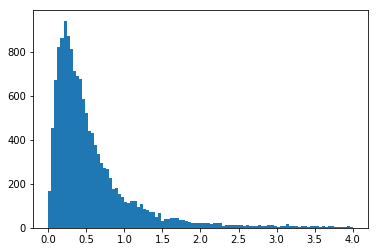

13664

In [325]:
plt.hist(WD_sdss['MWDD_d'],100,(0,4))
plt.show()
(WD_sdss['MWDD_d']<2).sum()

In [328]:
WD_sdss['MWDD_r'] = MWDD['sr'][WD_sdss['MWDD_index']]
WD_sdss['MWDD_u'] = MWDD['su'][WD_sdss['MWDD_index']]
WD_sdss['MWDD_g'] = MWDD['sg'][WD_sdss['MWDD_index']]
WD_sdss['MWDD_i'] = MWDD['si'][WD_sdss['MWDD_index']]
WD_sdss['nbOpt'] = MWDD['nbOpt'][WD_sdss['MWDD_index']]
WD_sdss['ismag'] = MWDD['ismag'][WD_sdss['MWDD_index']]
WD_sdss['spectype'] = MWDD['spectype'][WD_sdss['MWDD_index']]
WD_sdss['m_M'] = 5 * np.log10(1/WD_sdss['parallax']*1000) - 5
WD_sdss['name'] = MWDD['name'][WD_sdss['MWDD_index']]
WD_sdss['MWDD_teff'] = MWDD['teff'][WD_sdss['MWDD_index']]
WD_sdss['MWDD_Dteff'] = MWDD['Dteff'][WD_sdss['MWDD_index']]
WD_sdss['MWDD_logg'] = MWDD['logg'][WD_sdss['MWDD_index']]
WD_sdss['MWDD_Dlogg'] = MWDD['Dlogg'][WD_sdss['MWDD_index']]
WD_sdss['MWDD_mass'] = MWDD['mass'][WD_sdss['MWDD_index']]
WD_sdss['MWDD_Dmass'] = MWDD['Dmass'][WD_sdss['MWDD_index']]
WD_sdss['ismag_more'] = MWDD['ismag_more'][WD_sdss['MWDD_index']]

if version=='new':
    WD_sdss['sdss_u'] = WD_sdss['umag']
    WD_sdss['sdss_g'] = WD_sdss['gmag']
    WD_sdss['sdss_r'] = WD_sdss['rmag']
    WD_sdss['sdss_i'] = WD_sdss['imag']
    WD_sdss['sdss_z'] = WD_sdss['zmag']
    WD_sdss['parallax_over_error'] = WD_sdss['parallax']/WD_sdss['parallax_error']
    np.save('WD_table_sdss_local_new.npy',np.array([{'table':WD_sdss}]))

if version=='old':
    WD_sdss['sdss_u'] = Gaia_xmatch_sdss['u_mag']
    WD_sdss['sdss_g'] = Gaia_xmatch_sdss['g_mag']
    WD_sdss['sdss_r'] = Gaia_xmatch_sdss['r_mag']
    WD_sdss['sdss_i'] = Gaia_xmatch_sdss['i_mag']
    WD_sdss['sdss_z'] = Gaia_xmatch_sdss['z_mag']
    np.save('WD_table_sdss_local_old.npy',np.array([{'table':WD_sdss,'sdss':Gaia_xmatch_sdss}]))


In [160]:
WD_sdss[0]

solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,astrometric_sigma5d_max,frame_rotator_object_type,matched_observations,duplicated_source,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_flux_over_error,phot_g_mean_mag,phot_bp_n_obs,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_flux_over_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,phot_variable_flag,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,epoch_photometry_url,index,MWDD_index,MWDD_d,MWDD_r,MWDD_u,MWDD_g,MWDD_i,nbOpt,ismag,spectype,m_M,name,teff,Dteff,logg,Dlogg,mass,Dmass,ismag_more,MWDD_teff,MWDD_Dteff,MWDD_logg,MWDD_Dlogg,MWDD_mass,MWDD_Dmass,sdss_u,sdss_g,sdss_r,sdss_i,sdss_z
,,,,yr,deg,mas,deg,mas,mas,mas,,mas.yr**-1,mas.yr**-1,mas.yr**-1,mas.yr**-1,,,,,,,,,,,,,,,,,mas,,,,mas**-2,um**-1,um**-1,,,,mas,,,,,'electron'.s**-1,'electron'.s**-1,,mag,,'electron'.s**-1,'electron'.s**-1,,mag,,'electron'.s**-1,'electron'.s**-1,,mag,,,mag,mag,mag,km.s**-1,km.s**-1,,K,log(cm.s**-2),'dex',,deg,deg,deg,deg,,K,K,K,mag,mag,mag,mag,mag,mag,,Rsun,Rsun,Rsun,Lsun,Lsun,Lsun,,,,,,,,,,,,,mas,,,,,,,,,,,,,,,mag,mag,mag,mag,mag
int64,object,int64,int64,float64,float64,float64,float64,float64,float64,float64,float32,float64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,int32,int32,int32,float32,float32,float64,float64,int16,bool,float32,float64,float64,float32,int16,int16,float32,int32,int16,bool,int32,float64,float64,float32,float32,int32,float64,float64,float32,float32,int32,float64,float64,float32,float32,float32,int16,float32,float32,float32,float64,float64,int32,float32,float32,float32,object,float64,float64,float64,float64,int64,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,float32,float32,float32,float32,float32,float32,object,object,int64,int64,float64,float64,float64,float64,float64,int64,str3,str72,float64,str25,float64,float64,float64,float64,float64,float64,bool,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1635721458409799680,Gaia DR2 4415230812694612864,4415230812694612864,1274360781,2015.5,230.67593506350235,0.24919984628163394,-2.1121742214144787,0.1940421640036003,9.7635031411517943,0.27512524506057434,35.487484,-39.501045652041213,0.47088992504021743,-42.223695533877041,0.40482413423899682,-0.038358334,-0.38797119,0.072090372,-0.15360571,-0.11975506,-0.11250493,0.29903024,-0.12843218,0.03210634,-0.026666433,134,0,133,1,0.16502446,129.98389,0.0,0.0,31,False,0.37662414,1.5948809524523362,0.069876527673224734,0.080466218,15,10,0.41771612,0,15,False,131,629.77995939074174,1.8312524036112141,343.90671,18.690393,13,390.5774891332826,15.000452020161255,26.037714,18.87212,11,343.5186216226968,7.370851174419685,46.605015,18.422045,1.165639,0,0.45

In [161]:
small_d = (WD_sdss['MWDD_d']<2) * (WD_sdss['nbOpt']>0)
(small_d).sum()

4557

## 2. spectral files: create spec.npy

to continue from the cell on server,
1. then download the csv file and upload it to Casjob (finished)
2. match the obj_id with SEGUE list and get PLATE, MJD, FIBERID (finished)
3. download from Casjob in .csv format (finished)
4. change the null into empty (to be done below)
5. upload the non-null PLATE, MJD, FIBERID to SEGUE spec query (limit of 1000 for each time) https://dr14.sdss.org/optical/spectrum/search

### download spectra from SAS to dslogin01 or local

In [62]:
spec_boss = Table.read('WD_spec_boss.csv',format='csv')
spec_segue = Table.read('WD_spec_segue.csv',format='csv')
spec_sdss = Table.read('WD_spec_sdss.csv',format='csv')
spec_dr14 = Table.read('WD_spec_DR14.csv',format='csv')
spec_legacy = Table.read('WD_spec_legacy.csv',format='csv')
#table.remove_rows(np.where(table['index1'][1:]-table['index1'][:-1] == 0))
len(spec_boss), len(WD_sdss)

(18495, 18495)

In [578]:
table = spec_boss
with_spec = table['MJD']!='null'
print(with_spec.sum())
table[np.where(table['obj_id']==1237654398627152025)[0][0]]
#table[with_spec][0]

2458


obj_id,MJD,PLATE,FIBERID,ra,dec,index1
int64,str5,str4,str4,str18,str12,int64
1237654398627152025,null,null,null,null,null,68083


### download spectra by plate, mjd and fiber to dslogin01

In [15]:
def gen_download_command(table,code='26',name='legacy'):
    with_spec = table['MJD']!='null'
    download_command = '#!bash\n'
    for i in range(with_spec.sum()):
        PLATE = '%04i' % int(table['PLATE'][with_spec][i])
        MJD = '%05i' % int(table['MJD'][with_spec][i])
        FIBER = '%04i' % int(table['FIBERID'][with_spec][i])

        download_command+='wget -P /datascope/menard/group/scheng/Gaia/WD_spectra_'+\
        name+'/ -nc https://data.sdss.org/sas/dr14/sdss/spectro/redux/'+code+\
        '/spectra/lite/'+PLATE+'/spec-'+PLATE+'-'+MJD+'-'+FIBER+'.fits\n'
    return download_command, with_spec

In [16]:
download_legacy, with_spec_legacy = gen_download_command(spec_legacy,'26','legacy')
download_boss, with_spec_boss = gen_download_command(spec_boss,'v5_10_0','boss')
download_segue, with_spec_segue = gen_download_command(spec_segue,'104','segue')
f = open('WD_download_legacy.bash','w')
f.write(download_legacy)
f.close()
f = open('WD_download_boss.bash','w')
f.write(download_boss)
f.close()
f = open('WD_download_segue.bash','w')
f.write(download_segue)
f.close()

In [755]:
MWDD_boss = Table.read('WD_MWDD_spec_boss.csv',format='csv')
MWDD_legacy = Table.read('WD_MWDD_spec_legacy.csv',format='csv')

download_legacy, with_spec_legacy = gen_download_command(MWDD_legacy,'26','legacy')
download_boss, with_spec_boss = gen_download_command(MWDD_boss,'v5_10_0','boss')
f = open('WD_download_MWDD_legacy.bash','w')
f.write(download_legacy)
f.close()
f = open('WD_download_MWDD_boss.bash','w')
f.write(download_boss)
f.close()

In [17]:
with_spec_boss.sum()+with_spec_legacy.sum()-(with_spec_boss*with_spec_legacy).sum()

4831

1. save a bash file with header #!bash and add wget to each line.
2. execute the bash file to download spectral files from SDSS. (to the dslogin01 server)
3. move back to dslogin01 server to work

## download spec.npy (finished)
1. scp scheng@dslogin01.pha.jhu.edu:/home/scheng/Gaia/WD_spec_unnorm.npy .
2. scp scheng@dslogin01.pha.jhu.edu:/home/scheng/Gaia/WD_spec_boss.npy .
3. scp scheng@dslogin01.pha.jhu.edu:/home/scheng/Gaia/WD_spec_legacy.npy .

### load npy spec

In [515]:
WD_sdss = np.load('WD_table_sdss_local_old.npy')[0]['table']

In [516]:
#data = np.load('WD_spec_unnorm.npy')[0]
data = np.load('WD_spec_boss.npy')[0]
#data = np.load('WD_spec_legacy.npy')[0]


2458 2458


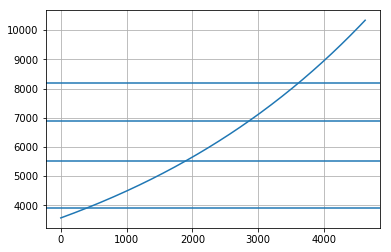

In [538]:
spec = data['spec']
lam_standard = data['lam_standard']
with_spec = data['with_spec']
print(len(spec), with_spec.sum())

plt.plot(lam_standard)
plt.axhline(3900)
plt.axhline(5500)
plt.axhline(6900)
plt.axhline(8200)
plt.grid()
plt.show()
g_band = np.arange(0,1500)
r_band = np.arange(1500,2500)
i_band = np.arange(2500,3250)
z_band = np.arange(3250,len(lam_standard))

In [518]:
WD_with_spec = WD_sdss[with_spec]
WD_with_spec['spec_g'] = -2.5*np.log10(spec[:,g_band].sum(axis=1))
WD_with_spec['spec_r'] = -2.5*np.log10(spec[:,r_band].sum(axis=1))
WD_with_spec['spec_i'] = -2.5*np.log10(spec[:,i_band].sum(axis=1))
WD_with_spec['spec_z'] = -2.5*np.log10(spec[:,z_band].sum(axis=1))
WD_with_spec['spec_bp'] = -2.5*np.log10(spec[:,0:2300].sum(axis=1))
WD_with_spec['spec_rp'] = -2.5*np.log10(spec[:,2200:].sum(axis=1))
WD_with_spec['spec_G'] = -2.5*np.log10(spec[:,:].sum(axis=1))

/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log10
  
/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log10
  
/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.
/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in log10
  after removing th

### spectral color validation

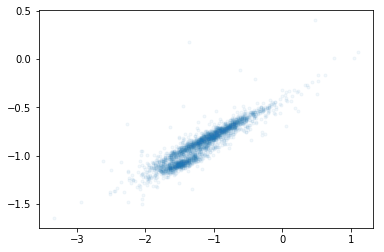

In [543]:
plt.plot(WD_with_spec['spec_bp'] - WD_with_spec['spec_rp'], \
         WD_with_spec['spec_r']-WD_with_spec['spec_i'],'.',alpha=0.05)
#plt.xlim(-1.7,0)
#plt.ylim(-1.3,-0.4)
plt.show()

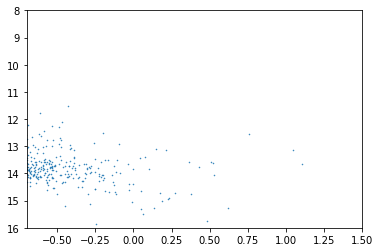

In [535]:
selected2 = WD_with_spec['m_M']<6
x = WD_with_spec['bp_rp']
x = WD_with_spec['spec_bp'] - WD_with_spec['spec_rp']
y = WD_with_spec['phot_g_mean_mag']-WD_with_spec['m_M']
plt.plot(x[selected2], \
         y[selected2],'.',alpha=1,ms=1)
plt.xlim(-0.7,1.5)
plt.ylim(16,8)
plt.show()

### MWDD, Gaia, and spectral color validation

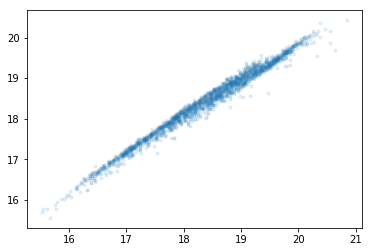

In [22]:
#plt.plot(WD_with_spec['MMDD_g'],WD_with_spec['spec_g'],'.',alpha=0.1)
plt.plot(WD_with_spec['MWDD_g'][WD_with_spec['MWDD_d']<1],\
         WD_with_spec['phot_g_mean_mag'][WD_with_spec['MWDD_d']<1],'.',alpha=0.1)
plt.show()

In [520]:
WD_with_spec[0]

solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,astrometric_sigma5d_max,frame_rotator_object_type,matched_observations,duplicated_source,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_flux_over_error,phot_g_mean_mag,phot_bp_n_obs,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_flux_over_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,phot_variable_flag,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,epoch_photometry_url,index,MWDD_index,MWDD_d,MWDD_r,MWDD_u,MWDD_g,MWDD_i,nbOpt,ismag,spectype,m_M,name,teff,Dteff,logg,Dlogg,mass,Dmass,ismag_more,MWDD_teff,MWDD_Dteff,MWDD_logg,MWDD_Dlogg,MWDD_mass,MWDD_Dmass,sdss_u,sdss_g,sdss_r,sdss_i,sdss_z,spec_g,spec_r,spec_i,spec_z,spec_bp,spec_rp,spec_G
,,,,yr,deg,mas,deg,mas,mas,mas,,mas.yr**-1,mas.yr**-1,mas.yr**-1,mas.yr**-1,,,,,,,,,,,,,,,,,mas,,,,mas**-2,um**-1,um**-1,,,,mas,,,,,'electron'.s**-1,'electron'.s**-1,,mag,,'electron'.s**-1,'electron'.s**-1,,mag,,'electron'.s**-1,'electron'.s**-1,,mag,,,mag,mag,mag,km.s**-1,km.s**-1,,K,log(cm.s**-2),'dex',,deg,deg,deg,deg,,K,K,K,mag,mag,mag,mag,mag,mag,,Rsun,Rsun,Rsun,Lsun,Lsun,Lsun,,,,,,,,,,,,,mas,,,,,,,,,,,,,,,mag,mag,mag,mag,mag,,,,,,,
int64,object,int64,int64,float64,float64,float64,float64,float64,float64,float64,float32,float64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,int32,int32,int32,float32,float32,float64,float64,int16,bool,float32,float64,float64,float32,int16,int16,float32,int32,int16,bool,int32,float64,float64,float32,float32,int32,float64,float64,float32,float32,int32,float64,float64,float32,float32,float32,int16,float32,float32,float32,float64,float64,int32,float32,float32,float32,object,float64,float64,float64,float64,int64,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,float32,float32,float32,float32,float32,float32,object,object,int64,int64,float64,float64,float64,float64,float64,int64,str3,str72,float64,str25,float64,float64,float64,float64,float64,float64,bool,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1635721458409799680,Gaia DR2 932308791461715712,932308791461715712,1280846015,2015.5,120.08473912475215,0.13079782346577748,45.958541792860998,0.10855262830652411,3.5973091464800442,0.20931973273653295,17.185715,15.450126926279619,0.26305188759175324,4.4278513499847794,0.18098955389533913,0.058193211,-0.38632405,-0.25254381,0.11807909,-0.35576552,-0.16146207,0.21066797,0.6402905,-0.13263372,-0.054714639,194,0,193,1,-0.79791701,172.31856,0.0,0.0,31,False,0.90747565,1.8325474253146541,0.037799922255296173,-0.13540317,22,12,0.26164374,0,24,False,208,1096.7524481688083,1.7885368079116128,613.2121,18.088095,19,876.25844177345562,8.54

## split in WD sequence

In [165]:
xmin = -0.40; xmax = 0.10; offset = 13.1; width = 0.20; slope = 1
xmin = -0.40; xmax = -0.12; offset = 12.5; width = 0.20; slope = 1
box = (xmin, xmax, offset, width, slope)

## HR diagram for MWDD

In [166]:
importlib.reload(WD_HR)

/Users/scheng/Gaia/WD_models.py:120: RuntimeWarning: invalid value encountered in less
  selected = ~np.isnan(bp_rp_fontaine+G_fontaine+age+para)*(G_fontaine<16)*(G_fontaine>8)
/Users/scheng/Gaia/WD_models.py:120: RuntimeWarning: invalid value encountered in greater
  selected = ~np.isnan(bp_rp_fontaine+G_fontaine+age+para)*(G_fontaine<16)*(G_fontaine>8)
/Users/scheng/Gaia/WD_models.py:14: RuntimeWarning: invalid value encountered in greater
  return (mass_ini>1.5)*mass_ini**(-2.3)
/Users/scheng/Gaia/WD_models.py:316: RuntimeWarning: divide by zero encountered in log10
  grid_logage, grid_logage_func = HR_to_para(np.log10(age),xy,bp_rp_fontaine,G_fontaine,age,\
/Users/scheng/Gaia/WD_models.py:325: RuntimeWarning: invalid value encountered in log10
  grid_logage_for_density, grid_logage_for_density_func = HR_to_para(np.log10(age_for_density),\


<module 'WD_HR' from '/Users/scheng/Gaia/WD_HR.py'>

In [119]:
(MWDD['spectype']=='DQA').sum()

7

In [118]:
for i in range(len(np.unique(MWDD['spectype']))):
    if ((MWDD['spectype']==np.unique(MWDD['spectype'])[i]).sum()>20):
        print(np.unique(MWDD['spectype'])[i], \
          (MWDD['spectype']==np.unique(MWDD['spectype'])[i]).sum())

A/DAZ 31
A/sdB 26
D+M 51
DA 21199
DA+DB/DC 33
DA+K 45
DA+M 1433
DA+M3 32
DA+M4 33
DA+M: 85
DA+dM 50
DA+dMe 41
DA: 1897
DA:+M 43
DAB 133
DAB/sdB 24
DAB: 69
DAH 430
DAH: 213
DAHM: 24
DAM 107
DAO 116
DAO/sdO 45
DAZ 157
DAZ: 152
DB 1368
DB+M 69
DB: 95
DBA 208
DBA: 57
DBAH: 79
DBAZ 30
DC 950
DC+M 52
DC+M: 21
DC-DQ 68
DC: 431
DO 70
DQ 268
DQ: 45
DZ 929
DZ: 45
DZA 51
ELM-DA 39
He-sdB 124
He-sdO 125


/Users/scheng/anaconda3/lib/python3.6/site-packages/numpy/ma/core.py:4009: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  check = compare(sdata, odata)


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

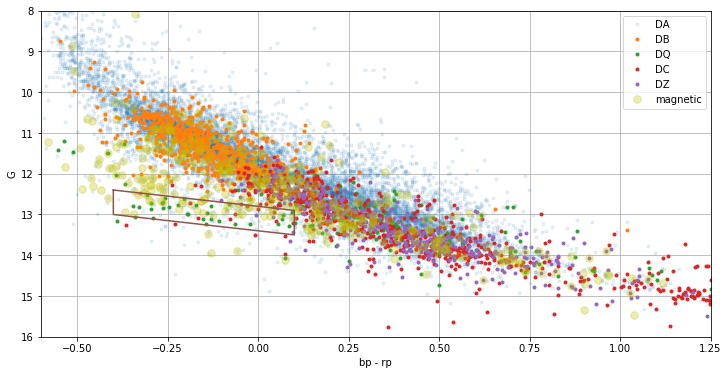

In [373]:
plt_list = ['DA','DB','DC','DQ','DZ','mag']
#plt_list = []
high_snr_sdss = (WD_sdss['parallax_over_error']>5) * (1/WD_sdss['parallax']<1.5)*\
    (WD_sdss['MWDD_d']<10)
_ = WD_HR.plot_HR(WD_sdss[high_snr_sdss],plt_list)
plt.show()

### Colour-Colour diagram for all SDSS (not only spectral) WD

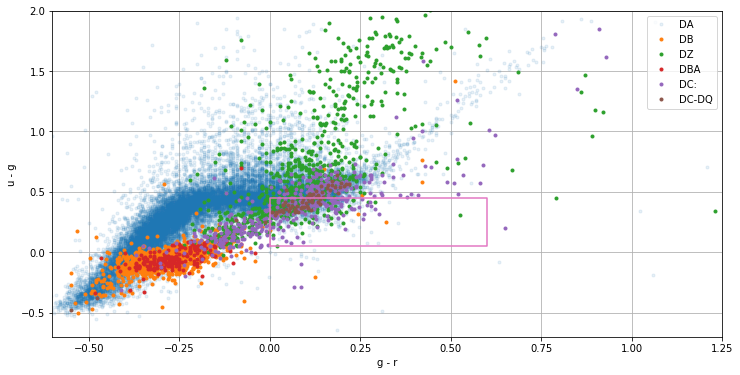

In [413]:
plt_list = ['DA','DB','DZ']
high_snr = (WD_sdss['parallax_over_error']>10)*(WD_sdss['MWDD_d']<2)
#plot_HR(WD_sdss[with_spec],plt_list,True,'CC',plt_box=True,box=box)
#plt.show()
_ = WD_HR.plot_HR(MWDD,plt_list,False,'CC_gr_MWDD',plt_box=True,box=box,\
            option_plt_list=['DBA','DC:','DC-DQ'])
plt.show()

In [149]:
MWDD

wdid,name,icrsra,icrsdec,spectype,teff,Dteff,logg,Dlogg,mass,Dmass,ismag,su,sg,sr,si,sz,nbUV,nbOpt,ra,dec,MWDD_u,MWDD_g,MWDD_r,MWDD_i,MWDD_z,ismag_more
str30,str25,str11,str12,str72,float64,float64,float64,float64,float64,float64,str3,float64,float64,float64,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,bool
1FGL J1338.9+1153,SDSS J133859.05+115316.73,13 38 59.06,11 53 16.73,DC,6300.0,3.0,10.0,0.5,--,--,--,18.7,18.2,17.84,17.59,17.38,0,0,204.746083333,11.8879805556,18.7,18.2,17.84,17.59,17.38,False
1RXS J035315.5+095700,1RXS J035315.5+095700,03 53 15.72,09 56 33.67,DA,--,--,--,--,--,--,yes,16.31689,16.74353,17.15262,17.50278,17.91106,0,1,58.3155,9.94268611111,16.31689,16.74353,17.15262,17.50278,17.91106,False
1RXS J093922.8+264404,SDSS J093921.83+264401.1,09 39 21.83,26 44 01.06,DA,60796.0,1247.0,7.97,0.067,0.685,0.029,--,16.63845,17.04309,17.55377,17.95405,18.27947,0,1,144.840958333,26.7336277778,16.63845,17.04309,17.55377,17.95405,18.27947,False
1RXS J101340.6+061556,SDSS_J101339.56+061529.5,10 13 39.56,06 15 29.57,DA,14375.0,603.0,7.64,0.198,0.437,0.076,--,20.4245,20.09832,20.32519,20.57995,20.77103,0,1,153.414833333,6.25821388889,20.4245,20.09832,20.32519,20.57995,20.77103,False
1RXS J120428.0+581934,SDSS_J120432.67+581936.9,12 04 32.66,58 19 37.10,DA,15725.0,545.0,7.99,0.121,0.625,0.073,--,20.18862,19.8097,20.08982,20.36053,20.65621,0,1,181.136083333,58.3269722222,20.18862,19.8097,20.08982,20.36053,20.65621,False
1RXS J132634.4+571052,SDSS J132629.58+571131.5,13 26 29.58,57 11 31.53,DA,125360.0,44960.0,6.8,0.37,0.38,0.19,--,18.05009,18.56828,19.12674,19.52487,19.90997,0,1,201.62325,57.1920916667,18.05009,18.56828,19.12674,19.52487,19.90997,False
1RXS J143738.0+362237,SDSS J143736.68+362213.4,14 37 36.68,36 22 13.38,DA,--,--,--,--,--,--,--,16.97241,17.32632,17.86103,18.20353,18.5195,0,1,219.402833333,36.3703833333,16.97241,17.32632,17.86103,18.20353,18.5195,False
1RXS J163421.8+365859,SDSS_J163418.25+365827.1,16 34 18.25,36 58 27.24,DA,10080.0,216.0,7.96,0.302,0.514,0.168,--,20.56238,20.02939,20.12296,20.22337,20.29463,0,1,248.576041667,36.9742333333,20.56238,20.02939,20.12296,20.22337,20.29463,False
2MASS J00025063-0450417,SDSS J000250.65-045041.6,00 02 50.65,-04 50 41.57,dM4+DB,6300.0,3.0,10.0,0.003,--,--,--,19.83114,19.72233,19.46758,18.56214,17.90593,0,1,0.711041666667,-4.84488055556,19.83114,19.72233,19.46758,18.56214,17.90593,False


In [1552]:
for i in range(selected_low_MWDD.sum()):
    print(WD_sdss[small_d][selected_low_MWDD]['name'][i])

SDSS J083602.91+303149.7
KUV 08084+4221
SDSS J110752.87-160705.4
SDSS J090707.34+253313.46
SDSS_J004705.83-004819.6
SDSS J112322.47+602940.06
SDSS J114851.68-012612.8
SDSS J090632.66+080716.0
SDSS J110005.06+602330.9
SDSS J110735.32+085924.5
SDSS J151314.08+545420.5
SDSS_J133340.33+640627.3
SDSS J113359.94+633113.2
SDSS J133420.97+041751.1
SDSS J114006.35+182402.3
SDSS J225828.49+280829.04
SDSS J004511.95+250330.9
SDSS J091440.38+111336.2
SDSS J150451.72+052140.82
SDSS_J143534.01+531815.0
SDSS J115937.81+134408.12
SDSS J141309.30+191832.0
SDSS J093054.57-012642.94
SDSS J120331.90+645101.3
SDSS_J094225.66+401105.2
SDSS J135107.00+074345.66
SDSS J104906.61+165923.75
SDSS J134845.96+110008.82
SDSS J140247.98+120410.92
SDSS J134946.37+125613.52
SDSS J072724.66+403622.0
SDSS_J113156.19+534654.1
SDSS J080042.48+065542.1
SDSS_J110217.13+541954.0
SDSS_J084717.71+322209.4
SDSS_J165407.32+195623.8
SDSS J141251.04+140104.01
SDSS J100932.73+524638.2
SDSS J110604.52+180231.27
SDSS J110058.04+175807

### HR diagram for my spec table

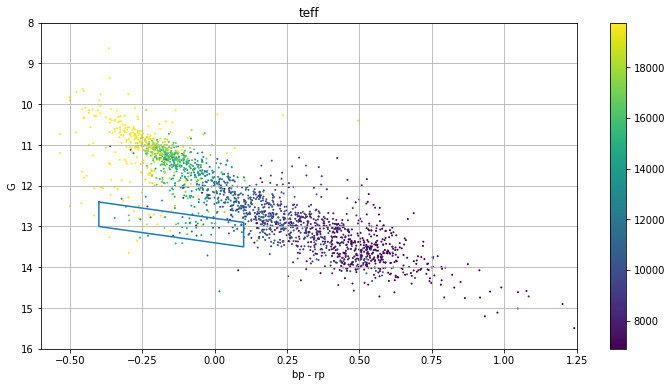

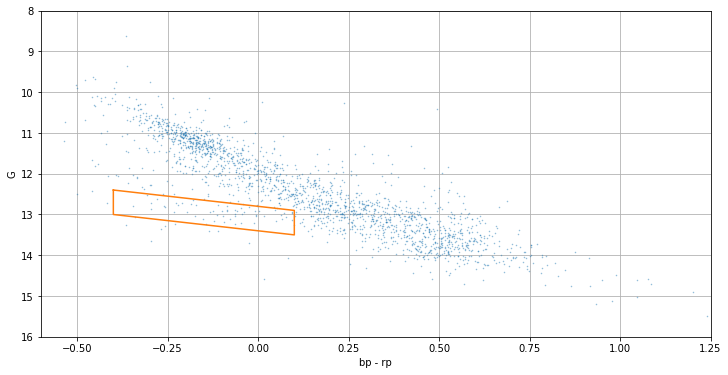

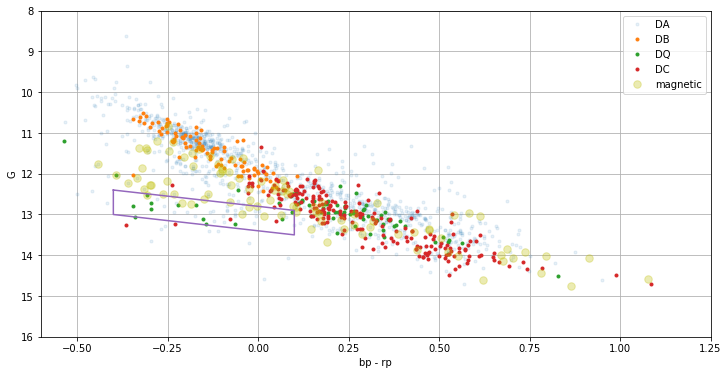

In [169]:
plt_list = ['DA','DB','DQ','DC','mag']
high_snr_low = (WD_with_spec['parallax_over_error']>10)*(WD_with_spec['MWDD_d']<2)
plot_HR(WD_with_spec[high_snr_low],plt_list,'teff',plt_box=True);plt.show()
plot_HR(WD_with_spec[high_snr_low],plt_list,True,plt_box=True);
plt.show()
selected_low = plot_HR(WD_with_spec[high_snr_low],plt_list,plt_box=True);
#plot_lowmass('DB','scatter',offset=0)
plt.show()

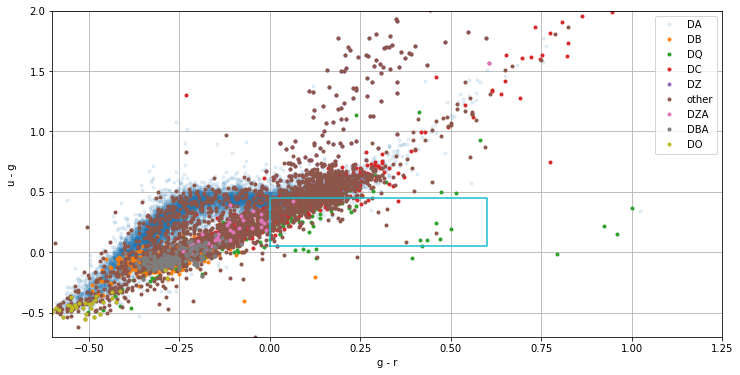

In [366]:
plt_list = ['DA','DQ','DZ','DB','DC','other']
high_snr = (WD_sdss['parallax_over_error']>5)*(WD_sdss['MWDD_d']<2)
#plot_HR(WD_sdss[with_spec],plt_list,True,'CC',plt_box=True,box=box)
#plt.show()
_ = WD_HR.plot_HR(WD_sdss[high_snr],plt_list,False,'CC_gr_MWDD',plt_box=True,box=box,\
            option_plt_list=['DZA','DBA','DO'])
plt.show()

In [487]:
for i in range(selected_low.sum()):
    print(WD_with_spec[selected_low]['name'][i])

SDSS J083602.91+303149.7
SDSS_J220911.31-003543.0
SDSS J162205.12+184957.3
SDSS J090707.34+253313.46
SDSS_J004705.83-004819.6
SDSS J112322.47+602940.06
SDSS J110005.06+602330.9
SDSS J074712.63+452714.0
SDSS J133420.97+041751.1
SDSS J114006.35+182402.3
SDSS J225828.49+280829.04
SDSS J004511.95+250330.9
SDSS J091440.38+111336.2
SDSS J150451.72+052140.82
SDSS J115937.81+134408.12
SDSS J093054.57-012642.94
SDSS J120331.90+645101.3
SDSS J135107.00+074345.66
SDSS J083052.11+151021.07
SDSS J093638.04+060709.54
SDSS J104906.61+165923.75
SDSS J134845.96+110008.82
SDSS J140247.98+120410.92
SDSS J134946.37+125613.52
SDSS J072724.66+403622.0
SDSS J110505.81+522522.23
SDSS J112148.77+103934.13
SDSS_J110217.13+541954.0
SDSS J093956.90+371026.37
SDSS J141251.04+140104.01
SDSS J100932.73+524638.2
SDSS J110604.52+180231.27
SDSS J224459.62+331017.40
SDSS J144854.80+051903.54
SDSS J150716.29+070654.77
SDSS J151130.20+422023.0
SDSS J095837.00+585303.01
SDSS J150318.12+075718.02
SDSS J151542.14+325752.01
S

### validation for a specific object 'SDSS J144707.42+585506.7'

In [1556]:
print(np.where(WD_sdss['name'] == 'SDSS J144707.42+585506.7'))
WD_sdss[np.where(WD_sdss['name'] == 'SDSS J144707.42+585506.7')]

(array([17155]),)


solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,parallax_over_error,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,astrometric_n_obs_al,astrometric_n_obs_ac,astrometric_n_good_obs_al,astrometric_n_bad_obs_al,astrometric_gof_al,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_params_solved,astrometric_primary_flag,astrometric_weight_al,astrometric_pseudo_colour,astrometric_pseudo_colour_error,mean_varpi_factor_al,astrometric_matched_observations,visibility_periods_used,astrometric_sigma5d_max,frame_rotator_object_type,matched_observations,duplicated_source,phot_g_n_obs,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_flux_over_error,phot_g_mean_mag,phot_bp_n_obs,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_flux_over_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_mean_mag,phot_bp_rp_excess_factor,phot_proc_mode,bp_rp,bp_g,g_rp,radial_velocity,radial_velocity_error,rv_nb_transits,rv_template_teff,rv_template_logg,rv_template_fe_h,phot_variable_flag,l,b,ecl_lon,ecl_lat,priam_flags,teff_val,teff_percentile_lower,teff_percentile_upper,a_g_val,a_g_percentile_lower,a_g_percentile_upper,e_bp_min_rp_val,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,epoch_photometry_url,index,MWDD_index,MWDD_d,MWDD_r,MWDD_u,MWDD_g,MWDD_i,nbOpt,ismag,spectype,m_M,name,teff,Dteff,logg,Dlogg,mass,Dmass,ismag_more
,,,,yr,deg,mas,deg,mas,mas,mas,,mas.yr**-1,mas.yr**-1,mas.yr**-1,mas.yr**-1,,,,,,,,,,,,,,,,,mas,,,,mas**-2,um**-1,um**-1,,,,mas,,,,,'electron'.s**-1,'electron'.s**-1,,mag,,'electron'.s**-1,'electron'.s**-1,,mag,,'electron'.s**-1,'electron'.s**-1,,mag,,,mag,mag,mag,km.s**-1,km.s**-1,,K,log(cm.s**-2),'dex',,deg,deg,deg,deg,,K,K,K,mag,mag,mag,mag,mag,mag,,Rsun,Rsun,Rsun,Lsun,Lsun,Lsun,,,,,,,,,,,,,mas,,,,,,,,
int64,object,int64,int64,float64,float64,float64,float64,float64,float64,float64,float32,float64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,int32,int32,int32,float32,float32,float64,float64,int16,bool,float32,float64,float64,float32,int16,int16,float32,int32,int16,bool,int32,float64,float64,float32,float32,int32,float64,float64,float32,float32,int32,float64,float64,float32,float32,float32,int16,float32,float32,float32,float64,float64,int32,float32,float32,float32,object,float64,float64,float64,float64,int64,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,float32,float32,float32,float32,float32,float32,object,object,int64,int64,float64,float64,float64,float64,float64,int64,str3,str72,float64,str25,float64,float64,float64,float64,float64,float64,bool
1635721458409799680,Gaia DR2 1617015089130028544,1617015089130028544,505416487,2015.5,221.7808014430409,0.27253396941621455,58.918596889206917,0.24519347622234502,5.2004073533813449,0.27157483629607582,19.149076,-13.573075816645476,0.53968904154124386,16.960848533382293,0.44838608091287385,-0.30289394,-0.067366697,-0.51914716,0.43593982,0.17533976,0.37344545,-0.373045,-0.21704355,-0.31025061,-0.31525302,249,0,246,3,1.7465672,280.67603,0.64473635825882147,0.87441968492542765,31,False,0.17383531,1.6716215857510479,0.072497316197207756,0.099794619,28,18,0.55190939,0,43,False,374,382.58538127628327,1.0973994166789145,348.62912,19.231544,35,330.61388424442328,15.764331121437223,20.972275,19.053085,36,157.94465459060899,7.1471987916582291,22.09882,19.265657,1.2769922,0,-0.2125721,-0.17845917,-0.03411293,--,--,0,--,--,--,NOT_AVAILABLE,98.756600440091546,52.436633478458731,176.27231625627118,67.307369398402315,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,-

In [1555]:
MWDD[35615]

wdid,name,icrsra,icrsdec,spectype,teff,Dteff,logg,Dlogg,mass,Dmass,ismag,su,sg,sr,si,sz,nbUV,nbOpt,ra,dec
str30,str25,str11,str12,str72,float64,float64,float64,float64,float64,float64,str3,float64,float64,float64,float64,float64,int64,int64,float64,float64
WD 1445+591,SDSS J144707.42+585506.7,14 47 07.42,58 55 06.77,DA,17600.0,870.0,8.82,0.11,1.12,0.06,--,19.21802,19.05458,19.32452,19.53111,19.72042,0,1,221.780916667,58.9185472222


3240


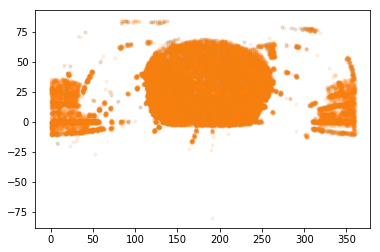

35555


In [963]:
table = WD_sdss
selected = (table['spectype']=='DA') * (table['nbOpt']>0)* (table['MWDD_d']<2)
plt.plot(table['ra'][selected],table['dec'][selected],'.',alpha=0.1)
table = MWDD
print(selected.sum())
selected = (table['spectype']!='DAAA') * (table['nbOpt']>0) #* (table['sr']>0)
plt.plot(table['ra'][selected],table['dec'][selected],'.',alpha=0.1)
plt.show()
print(selected.sum())

In [ ]:
selected = (table['spectype']!='DAAA') * (table['nbOpt']>-1) #* (table['sr']>0)
plt.plot(table['su'][selected]-table['su'][selected],table['dec'][selected],'.',alpha=0.1)
plt.show()
print(selected.sum())

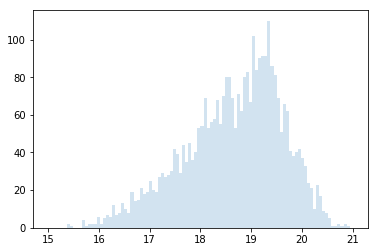

3240


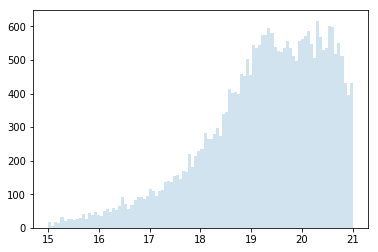

35552


In [966]:
table = WD_sdss
selected = (table['spectype']=='DA') * (table['nbOpt']>0) * (table['MWDD_d']<2)
plt.hist(table['MWDD_u'][selected],100,[15,21],alpha=0.2)
plt.show()
table = MWDD
print(selected.sum())
selected = (table['spectype']!='DAAAAA') * (table['nbOpt']>0) * (table['sr']>0)
plt.hist(table['su'][selected],100,[15,21],alpha=0.2)
plt.show()
print(selected.sum())

In [954]:
(MWDD_more['objid']>0).sum(), len(MWDD_more)

(36665, 36961)

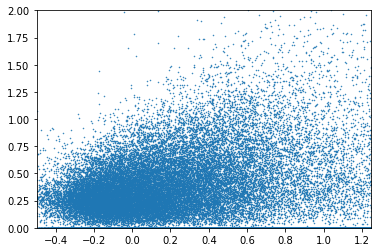

In [1113]:
table = WD
x = table['bp_rp']
y = table['phot_bp_rp_excess_factor']
y = table['astrometric_excess_noise']
plt.plot(x,y,'.',ms=1)
plt.ylim(1.1,1.3)
plt.ylim(0,2)
plt.xlim(-0.5,1.25)
plt.show()

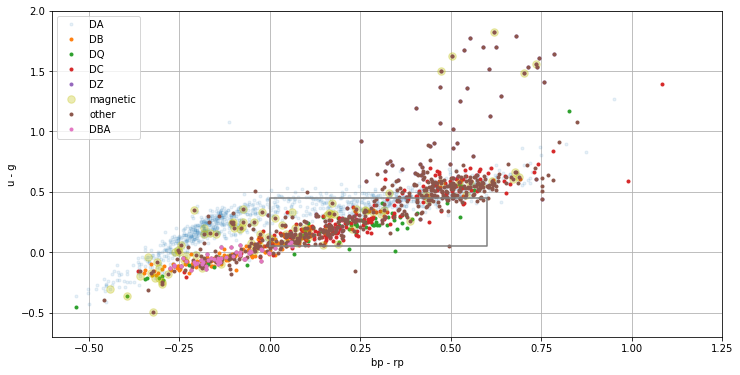

In [371]:
xmin = -0.6; xmax = 0.4; offset = -0.25; width = 0.30; slope = 0 # low Q
xmin = -0.0; xmax = 0.6; offset = 0.25; width = 0.20; slope = 0 # high Q
box = (xmin, xmax, offset, width, slope)
plt_list = ['DA','DB','DQ','DC','mag','DZ','other']
high_snr = (WD_with_spec['parallax_over_error']>10)*(WD_with_spec['MWDD_d']<2)
#plot_HR(WD_sdss[with_spec],plt_list,True,'CC',plt_box=True,box=box)
#plt.show()
selected_Q_high = WD_HR.plot_HR(WD_with_spec[high_snr],plt_list,False,'CC',\
                                plt_box=True,box=box,option_plt_list=['DBA'])
plt.show()

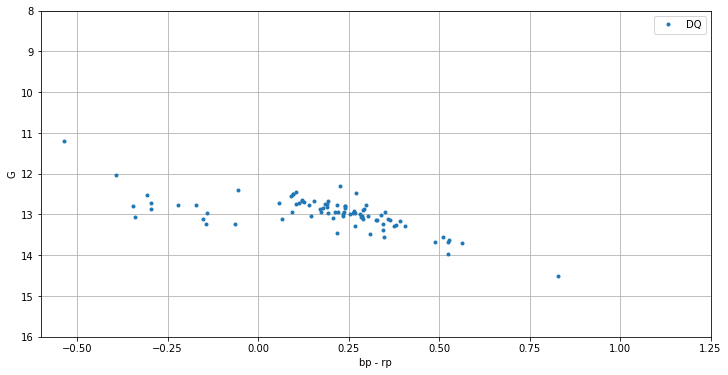

In [1127]:
xmin = -0.0; xmax = 0.6; offset = 0.25; width = 0.20; slope = 0 # high Q
box = [-0.60,0.00,13.5,0.30,4]
plt_list = ['DQ']
high_snr_low = (WD_with_spec['parallax_over_error']>10)*(WD_with_spec['MWDD_d']<2)
selected_highmass = plot_HR(WD_with_spec[high_snr_low],plt_list,plt_box=False);
plt.show()

In [510]:
def plot_spec(table,spec,selected,element=['H','He','C','Na']):
    n = selected.sum()
    spec_selected = spec[selected,:]
    WD_with_spec_selected = table[selected].copy()
    WD_with_spec_selected['spec_index'] = np.arange(n)
    WD_with_spec_selected.sort('bp_rp')
    index = WD_with_spec_selected['spec_index']
    print(n)
    fig, axes = plt.subplots(n,1, sharex='col',figsize=(10,n*3))
    ismag_text = np.array(WD_with_spec_selected['ismag'])
    for i in range(n):
        if 'H' in element:
            axes[i].axvline(6563,c='orange',alpha=0.1)
            axes[i].axvline(4861.3615,c='orange',alpha=0.1)
            axes[i].axvline(4340.462,c='orange',alpha=0.1)
            axes[i].axvline(4101.74,c='orange',alpha=0.1)
            axes[i].axvline(3970.072,c='orange',alpha=0.1)
            axes[i].axvline(3646,c='orange',alpha=0.1)            
        if 'Na' in element:
            axes[i].axvline(5893,c='y')
        if 'He' in element:
            axes[i].axvline(5875.62,c='r')
            axes[i].axvline(6678.15,c='r')
            axes[i].axvline(5015.67,c='r')
            axes[i].axvline(4921.93,c='r')
            axes[i].axvline(4713.14,c='r')
            axes[i].axvline(4471.48,c='r')
            axes[i].axvline(3888.6,c='r')
            axes[i].axvline(4026.19,c='r')
            axes[i].axvline(4120.8,c='r')
            axes[i].axvline(5047.7,c='r')
            axes[i].axvline(4387.9,c='r')
            axes[i].axvline(7065,c='r')  
            axes[i].axvline(7281,c='r')  
            axes[i].axvline(5047.7,c='r')  
            axes[i].axvline(5047.7,c='r')  
        if 'Ca' in element:
            axes[i].axvline(3969,c='r',alpha=0.1)
            axes[i].axvline(3934,c='r',alpha=0.1)
        if 'C' in element:
            axes[i].axvline(5170.462,c='b',alpha=0.1)
            axes[i].axvline(4269.0197,c='b',alpha=0.1)
            axes[i].axvline(7119.90,c='b',alpha=0.1)
            axes[i].axvline(8335.1443,c='b',alpha=0.1)
            axes[i].axvline(6013.22  ,c='b',alpha=0.1)
            axes[i].axvline(5800.594,c='b',alpha=0.1)
            axes[i].axvline(5380.330,c='b',alpha=0.1)
            axes[i].axvline(5052.15,c='b',alpha=0.1)
            axes[i].axvline(5039.07,c='b',alpha=0.1)
            axes[i].axvline(4932.02,c='b',alpha=0.1)
            axes[i].axvline(4771.73,c='b',alpha=0.1)
            axes[i].axvline(4478.58,c='b',alpha=0.1)
            axes[i].axvline(4371.38,c='b',alpha=0.1)
            axes[i].axvline(4228.326,c='b',alpha=0.1)
            axes[i].axvline(4065.24,c='b',alpha=0.1)
            axes[i].axvline(4029.41,c='b',alpha=0.1)
            axes[i].axvline(3961.403,c='b',alpha=0.1)
            axes[i].axvline(3833.34,c='b',alpha=0.1)
            axes[i].axvline(9094.83,c='b',alpha=0.1)
            axes[i].axvline(9405.72,c='b',alpha=0.1)
            axes[i].axvline(5889.772,c='b',alpha=0.3)
            axes[i].axvline(6587,c='b',alpha=0.3)
            axes[i].axvline(6828,c='b',alpha=0.3)
            axes[i].axvline(7236,c='b',alpha=0.3)
           
            axes[i].axvline(4382,c='b',ls='--',alpha=0.1)
            axes[i].axvline(4737,c='b',ls='--',alpha=0.1)
            axes[i].axvline(5165,c='b',ls='--',alpha=0.1)
            axes[i].axvline(5635,c='b',ls='--',alpha=0.1)
        axes[i].plot(lam_standard,\
                     (spec_selected[index[i],:]/spec_selected[index[i],:].mean()) )
        axes[i].text(7000,1,WD_with_spec_selected['name'][i]+' '+\
                     WD_with_spec_selected['spectype'][i]+' '+\
                     ismag_text[i]+'  '+\
                     '%.3f' % WD_with_spec_selected['bp_rp'][i]+' '+\
                    '%i' % WD_with_spec_selected['teff'][i]+' '+\
                     '%.3f' % WD_with_spec_selected['MWDD_d'][i]+' '+\
                    str(WD_with_spec_selected['source_id'][i]))
        axes[i].set_ylim(0,4)
        #axes[i].set_ylim(-1,1)
        #axes[i].set_xscale('log')
    plt.show()
    
def imshow_spec(table,spec,selected):
    plt.figure(figsize=(18,18))
    n = selected.sum()
    spec_selected = spec[selected,:]
    WD_with_spec_selected = table[selected].copy()
    WD_with_spec_selected['spec_index'] = np.arange(n)
    WD_with_spec_selected.sort('bp_rp')
    index = WD_with_spec_selected['spec_index']
    plt.imshow(spec_selected[index,:]/spec_selected[index,:].mean(axis=1).reshape(-1,1),
               aspect='auto',vmin=0,vmax=3)
    plt.tick_params()
    plt.show()

In [208]:
def get_v_and_ev(table):
    from astropy.coordinates import SkyCoord  # High-level coordinates
    from astropy.coordinates import ICRS, Galactic # Low-level frames
    import astropy.units as u
    c = SkyCoord(ra=np.array(table['ra'])*u.deg, dec=np.array(table['dec'])*u.deg, \
             pm_ra_cosdec=np.array(table['pmra'])*u.mas/u.yr, pm_dec=np.array(table['pmdec'])*u.mas/u.yr)
    pml = c.transform_to(Galactic).pm_l_cosb.value
    pmb = c.transform_to(Galactic).pm_b.value
    factor = 1/1000 * (1/table['parallax']*1000)*1.5*10**8/3600/24/365.24
    v = ((pml*factor+5*np.sin(table['l']/180*np.pi)-10*np.cos(table['l']/180*np.pi))**2 +\
         (pmb*factor+7*np.sin(table['b']/180*np.pi))**2)**0.5
    ev = (table['pmra_error']**2 + table['pmdec_error']**2)**0.5*factor
    return v, ev

In [508]:
importlib.reload(WD_HR)
WD_with_spec['v'], WD_with_spec['ev'],WD_with_spec['U'], WD_with_spec['V'],\
        WD_with_spec['W'] = WD_HR.get_v_and_ev(WD_with_spec)
WD_with_spec['G'] = WD_with_spec['phot_g_mean_mag'] - 5*np.log10(1/WD_with_spec['parallax']*1000)+5

TypeError: unsupported operand type(s) for *: 'MaskedColumn' and 'Unit'

In [306]:
func_select = lambda x, y, offset, slope, width, xmin, xmax:\
        (np.abs(offset+x*slope-y)<width) * (x>xmin) * (x<xmax)
-0.40,0.10,13.1,0.30,1
Q_branch = func_select(WD_with_spec['bp_rp'],WD_with_spec['G'],13.1,1.5,0.30,-0.40,0.20)
high_mass = func_select(WD_with_spec['bp_rp'],WD_with_spec['G'],13.8,4,1.10,-0.60,0.20)

0.714285714286


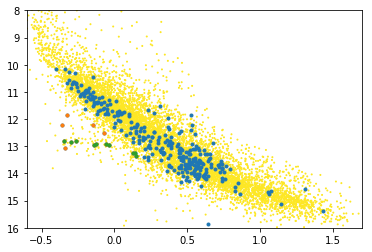

In [423]:
vlim = 70
c1 = eval('(WD_with_spec[\'v\']>vlim)')
plt.scatter(WD_for_matching['bp_rp'][(WD_for_matching['v']>vlim)],\
         WD_for_matching['G'][(WD_for_matching['v']>vlim)],\
            c=WD_for_matching['v'][(WD_for_matching['v']>vlim)],s=1,\
           vmin=0,vmax=vlim)
plt.plot(WD_with_spec['bp_rp'][c1],\
         WD_with_spec['G'][c1],'.')
plt.plot(WD_with_spec['bp_rp'][high_mass*c1],\
         WD_with_spec['G'][high_mass*c1],'.')
plt.plot(WD_with_spec['bp_rp'][Q_branch*c1],
         WD_with_spec['G'][Q_branch*c1],'.')
print((Q_branch*c1).sum()/(high_mass*c1).sum())

plt.xlim(-0.6,1.7)
plt.ylim(16,8)
plt.show()

## average spec

In [461]:
importlib.reload(WD_HR)

<module 'WD_HR' from '/Users/scheng/Gaia/WD_HR.py'>

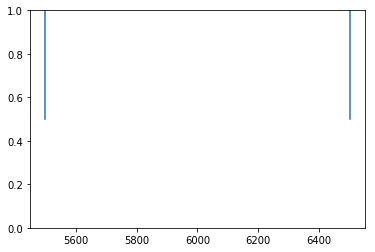

In [477]:
plt.axvline(x=5500,ymin=0.5,ymax=2.5)
plt.axvline(x=6500,ymin=0.5,ymax=2.5)
plt.show()

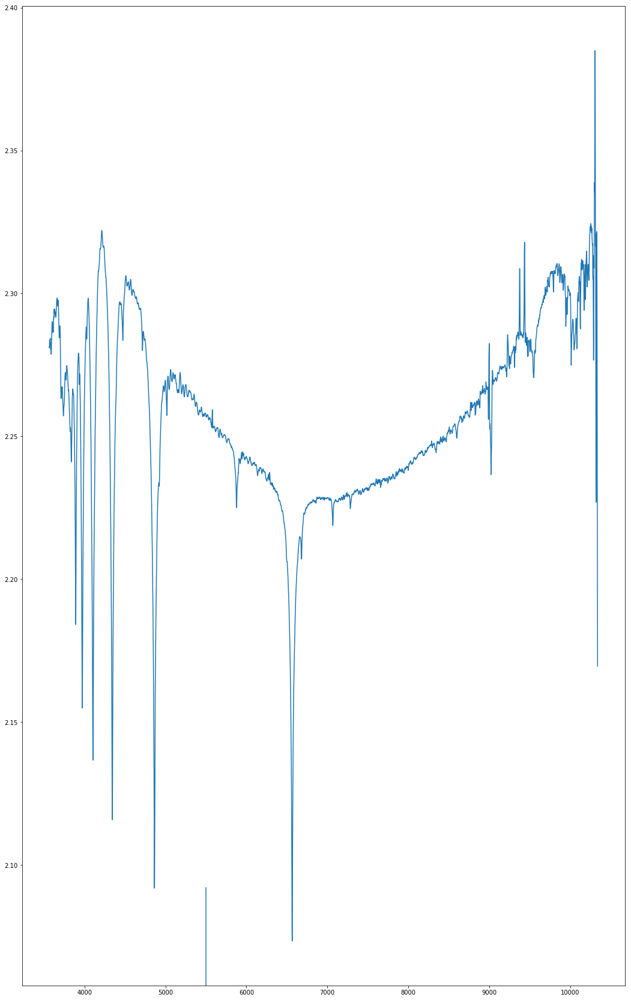

In [482]:
plt.figure(figsize=(18,30))
selected = WD_with_spec['spectype']!='DdddA'
plt.plot(lam_standard,np.log10(spec[selected].mean(axis=0))+0.9/5000*lam_standard)
#WD_HR.plot_lines(['He','Na','Ca','H'],ymin=2.3,ymax=2.4)
plt.axvline(x=5500,ymin=0,ymax=0.1)
#plt.yscale('log')
#plt.xlim(6500,6600)
plt.show()

/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log10
  


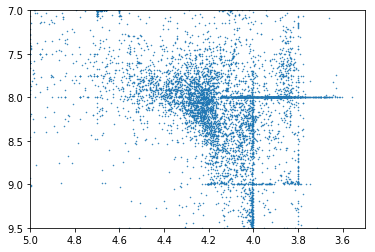

In [507]:
selected = (MWDD['spectype']!='DA') * (MWDD['MWDD_g']<20)
plt.plot(np.log10(MWDD['teff'][selected]),MWDD['logg'][selected],'.',ms=1,alpha=1)
plt.xlim(5,3.5)
plt.ylim(9.5,7)
plt.show()

## DB

11


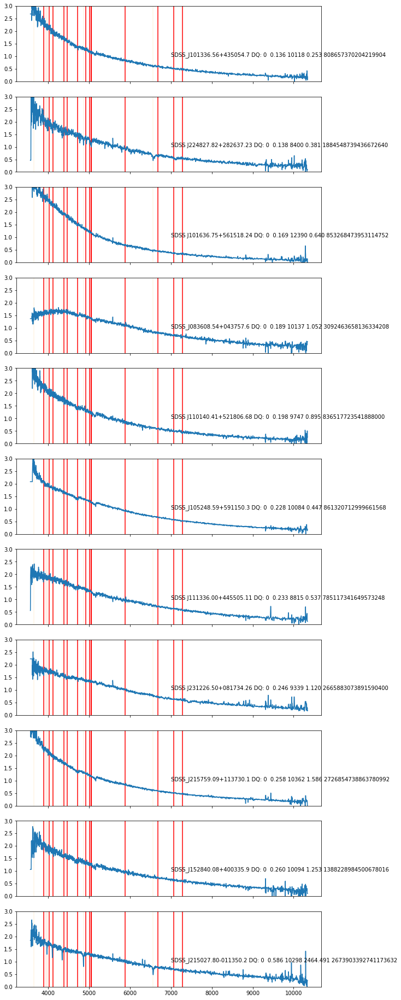

In [420]:
plot_spec(WD_with_spec,spec,\
          (WD_with_spec['spectype']=='DQ:')*(WD_with_spec['index']<10000),['He','Ca','H'])

## Q Branch

16


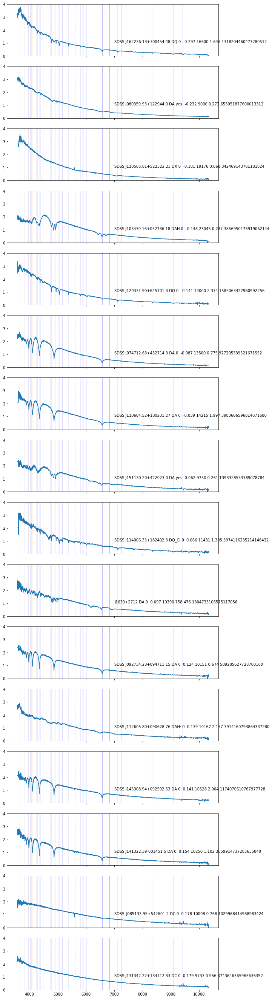

In [511]:
#plot_spec(WD_with_spec,spec,\
#          ((WD_with_spec['ismag_more']==True)|(WD_with_spec['ismag'].mask==False))*\
#          (WD_with_spec['bp_rp']<0.3)*(WD_with_spec['bp_rp']>0.2),['C','H'])
plot_spec(WD_with_spec,spec,\
          Q_branch * (WD_with_spec['v']>0) *\
          (1/WD_with_spec['parallax']<0.10),['C','H'])

#imshow_spec(WD_with_spec,spec,\
#          (WD_with_spec['spectype']=='DAZ'))

/Users/scheng/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


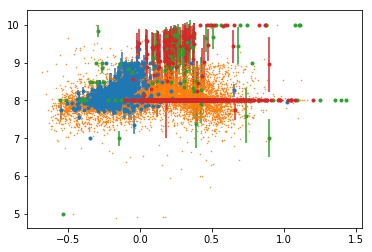

In [359]:
selected = (WD_sdss['MWDD_d']<10) * (WD_sdss['spectype']=='DB')
plt.errorbar(WD_sdss['bp_rp'][selected],WD_sdss['MWDD_logg'][selected],\
          WD_sdss['MWDD_Dlogg'][selected],0,'.')
selected = (WD_sdss['MWDD_d']<10) * (WD_sdss['spectype']=='DA')
plt.plot(WD_sdss['bp_rp'][selected],WD_sdss['MWDD_logg'][selected],\
          '.',ms=1)
selected = (WD_sdss['MWDD_d']<10) * (WD_sdss['spectype']=='DQ')
plt.errorbar(WD_sdss['bp_rp'][selected],WD_sdss['MWDD_logg'][selected],\
          WD_sdss['MWDD_Dlogg'][selected],0,'.')
selected = (WD_sdss['MWDD_d']<10) * (WD_sdss['spectype']=='DZ')
plt.errorbar(WD_sdss['bp_rp'][selected],WD_sdss['MWDD_logg'][selected],\
          WD_sdss['MWDD_Dlogg'][selected],0,'.')
plt.show()

## High Q on C-C diagram

48


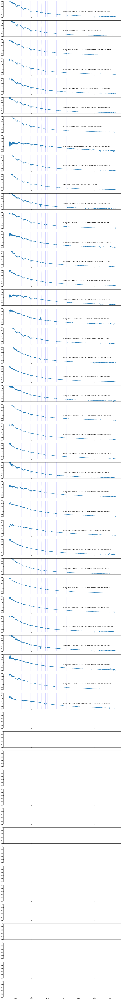

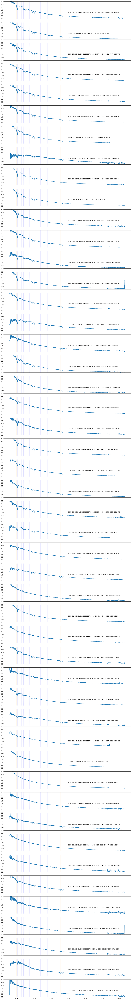

In [370]:
#plot_spec(WD_with_spec[high_snr_low],spec[high_snr_low],selected_Q_high*((WD_with_spec[high_snr_low]['spectype']=='DQ_CI')+\
#          (WD_with_spec[high_snr_low]['spectype']=='DQ')),['H','C',])
#print(WD_with_spec[high_snr_low][selected_Q_high*((WD_with_spec[high_snr_low]['spectype']=='DQ_CI')+\
#          (WD_with_spec[high_snr_low]['spectype']=='DQ'))]['name'])
#imshow_spec(WD_with_spec[high_snr_low],spec[high_snr_low],selected_Q_high*\
#            ((WD_with_spec[high_snr_low]['spectype']=='DQ_CI')+\
#          (WD_with_spec[high_snr_low]['spectype']=='DQ')))
plot_spec(WD_with_spec,spec,\
          (WD_with_spec['spectype']=='other')*(WD_with_spec['MWDD_d']<2)*\
          WD_with_spec['bp_rp']<0.,['C','H'])

## Low Q on C-C diagram

17


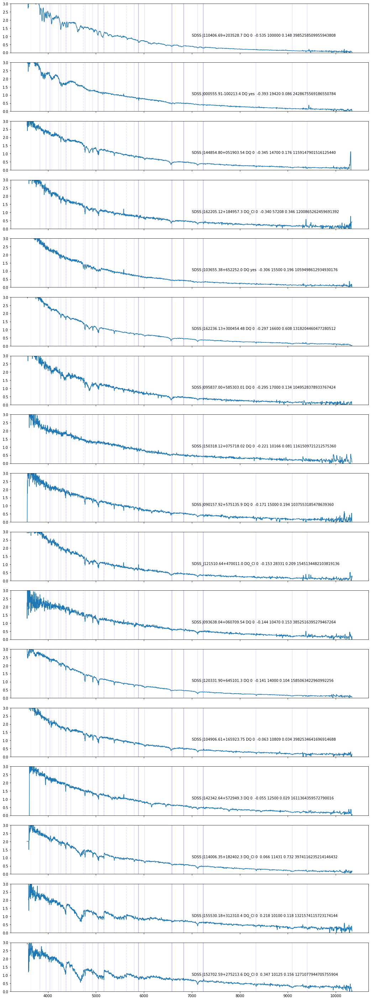

           name          
-------------------------
 SDSS J162205.12+184957.3
 SDSS J114006.35+182402.3
 SDSS J152702.59+275213.6
 SDSS J120331.90+645101.3
 SDSS J000555.91-100213.4
SDSS J093638.04+060709.54
SDSS J104906.61+165923.75
SDSS J144854.80+051903.54
SDSS J095837.00+585303.01
SDSS J150318.12+075718.02
 SDSS J103655.38+652252.0
 SDSS J110406.69+203528.7
SDSS J162236.13+300454.48
 SDSS J142342.64+572949.3
 SDSS J155530.18+312310.4
 SDSS J090157.92+575135.9
 SDSS_J121510.64+470011.0


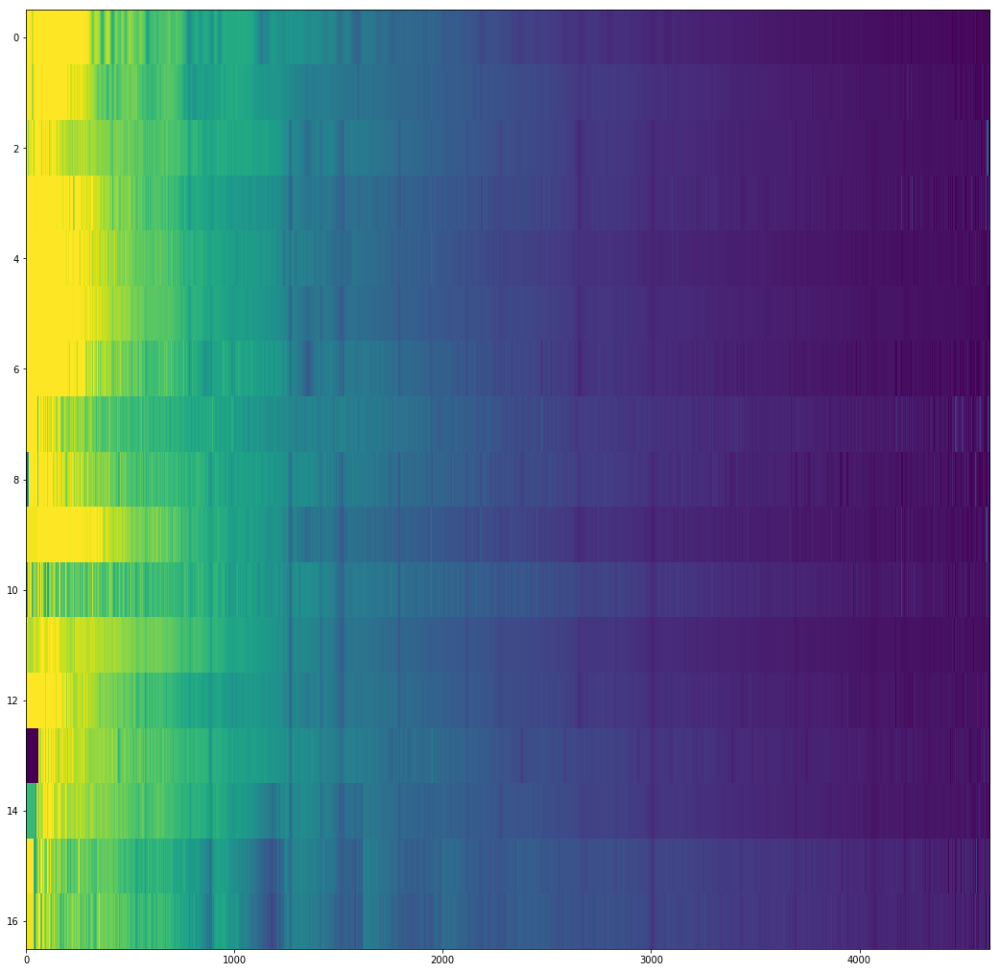

In [705]:
plot_spec(WD_with_spec[high_snr_low],spec[high_snr_low],selected_Q_low*((WD_with_spec[high_snr_low]['spectype']=='DQ_CI')+\
          (WD_with_spec[high_snr_low]['spectype']=='DQ')),['H','C',])
print(WD_with_spec[high_snr_low][selected_Q_low*((WD_with_spec[high_snr_low]['spectype']=='DQ_CI')+\
          (WD_with_spec[high_snr_low]['spectype']=='DQ'))]['name'])
imshow_spec(WD_with_spec[high_snr_low],spec[high_snr_low],selected_Q_low*((WD_with_spec[high_snr_low]['spectype']=='DQ_CI')+\
          (WD_with_spec[high_snr_low]['spectype']=='DQ')))

## Low

58


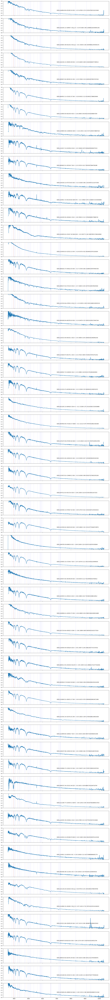

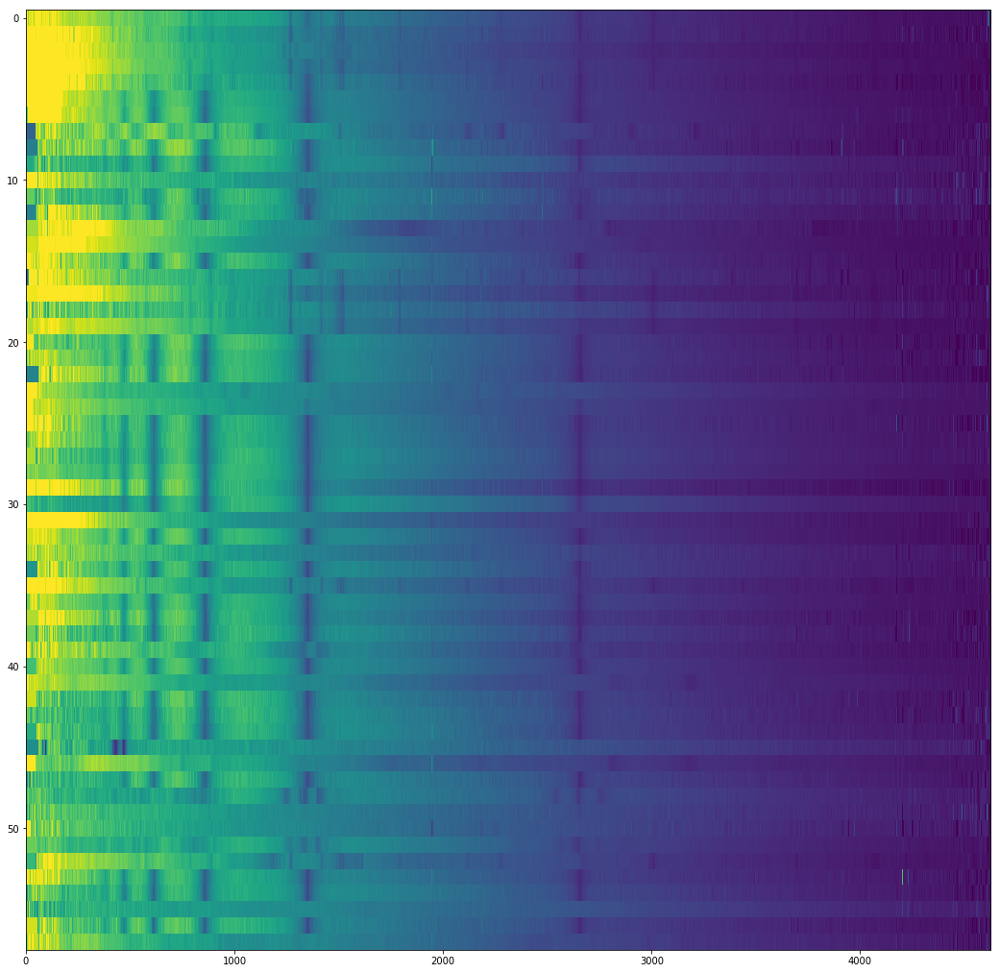

In [697]:
plot_spec(WD_with_spec[high_snr_low],spec[high_snr_low,:],selected_low,['C','H','Ca'])
imshow_spec(WD_with_spec[high_snr_low],spec[high_snr_low,:],selected_low)

## High mass

49


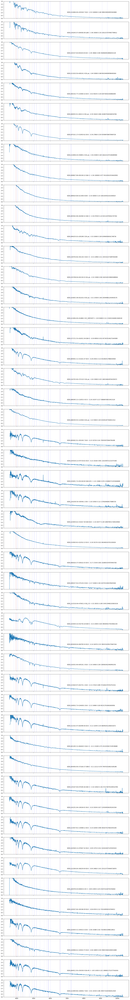

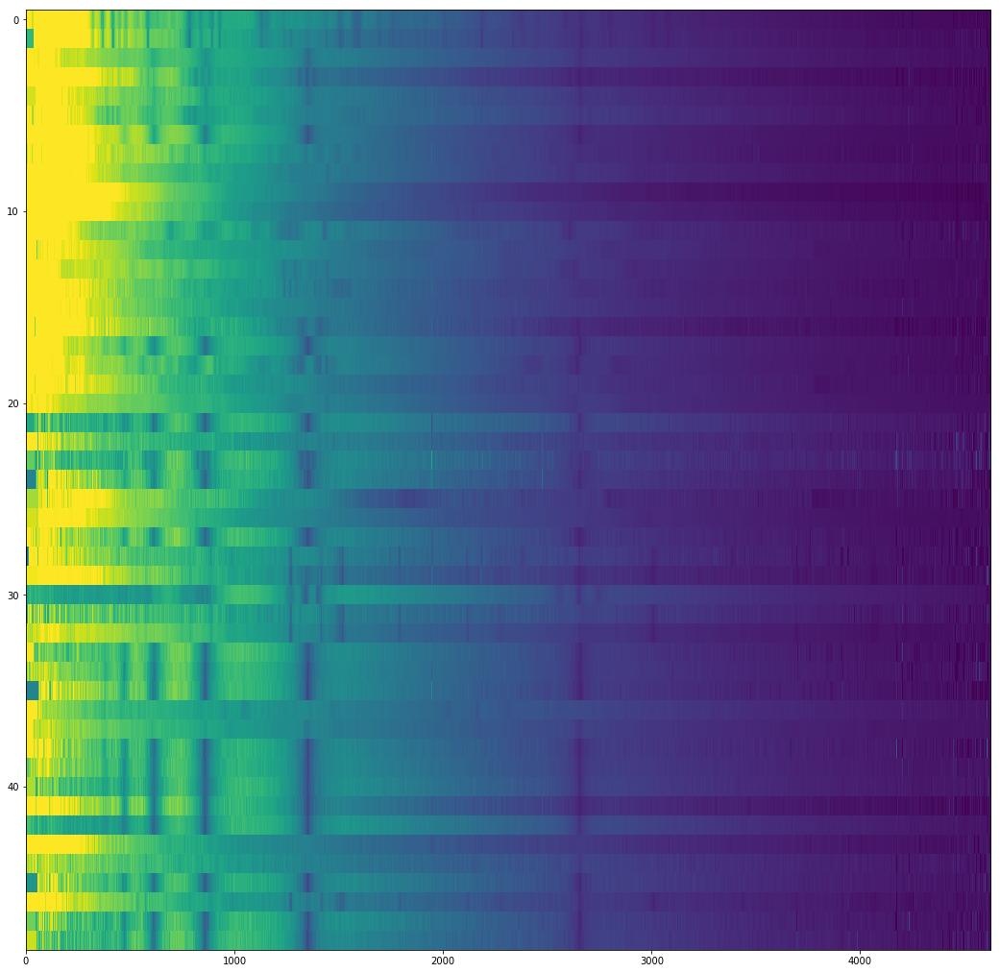

In [698]:
plot_spec(WD_with_spec[high_snr_low],spec[high_snr_low,:],selected_highmass,['C','H','Ca'])
imshow_spec(WD_with_spec[high_snr_low],spec[high_snr_low,:],selected_highmass)

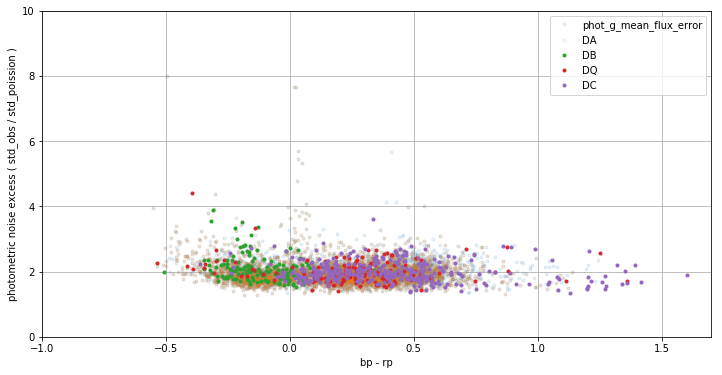

masked_BaseColumn(data = [False False False ..., False False False],
                  mask = False,
            fill_value = 1e+20)

In [1581]:
plot_HR(WD_sdss[small_d],func,func_select,['DA','DB','DQ','DC'],False,'Var')

## load all Gaia WD

In [40]:
WD = np.load('WD_selected.npy')[0]['WD']

In [1056]:
((WD['parallax_over_error']>10) * (1/WD['parallax']<0.1) * (WD['bp_rp']<0.2)).sum()

1635

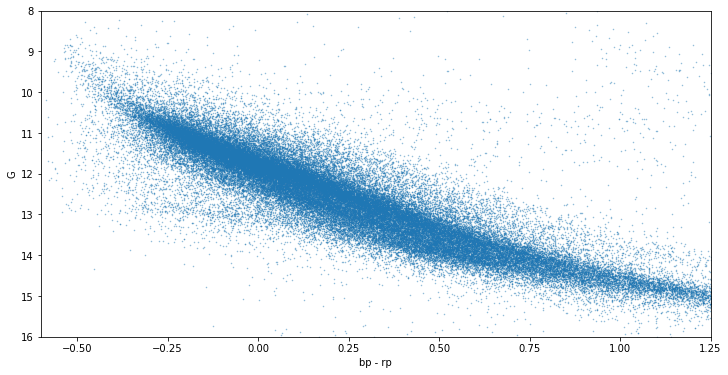

In [1131]:
highsnr = (WD['parallax_over_error']>10) * (1/WD['parallax']<0.5)
plot_HR(WD[highsnr],plt_list,True,plt_box=False)
#plot_lowmass('DA','scatter',0)
#plot_highmass('DA','scatter',0)
plt.grid('off')
plt.show()

In [ ]:
import WD_models

/Users/scheng/Gaia/WD_models.py:132: RuntimeWarning: invalid value encountered in less
  selected = ~np.isnan(bp_rp_fontaine+G_fontaine+age+para)*(G_fontaine<16)*(G_fontaine>10)
/Users/scheng/Gaia/WD_models.py:132: RuntimeWarning: invalid value encountered in greater
  selected = ~np.isnan(bp_rp_fontaine+G_fontaine+age+para)*(G_fontaine<16)*(G_fontaine>10)
/Users/scheng/Gaia/WD_models.py:26: RuntimeWarning: invalid value encountered in greater
  return (mass_ini>1.5)*mass_ini**(-2.3)
/Users/scheng/Gaia/WD_models.py:336: RuntimeWarning: divide by zero encountered in log10
  grid_Mbol, grid_Mbol_func = HR_to_para(Mbol,xy,False)
/Users/scheng/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:967: UserWarning: The following kwargs were not used by contour: 'aspect'
  s)
/Users/scheng/Gaia/WD_models.py:268: RuntimeWarning: invalid value encountered in greater
  grid_para = (grid_density * grid_MF); selected = grid_para>0


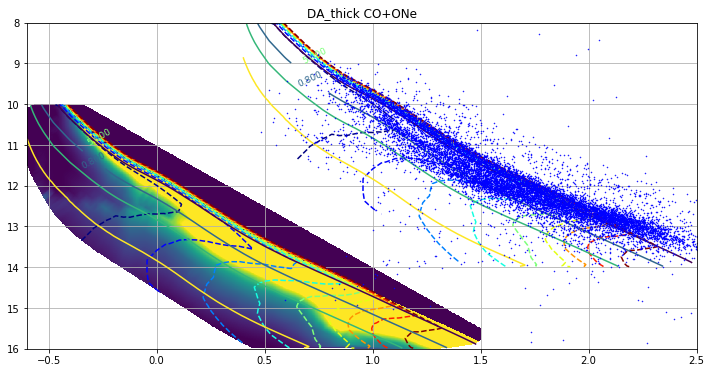

In [1150]:
import importlib
importlib.reload(WD_models)
new = WD_models.grid_MF * WD_models.grid_density

/Users/scheng/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:967: UserWarning: The following kwargs were not used by contour: 'aspect'
  s)
/Users/scheng/Gaia/WD_models.py:268: RuntimeWarning: invalid value encountered in greater
  grid_para = (grid_density * grid_MF); selected = grid_para>0


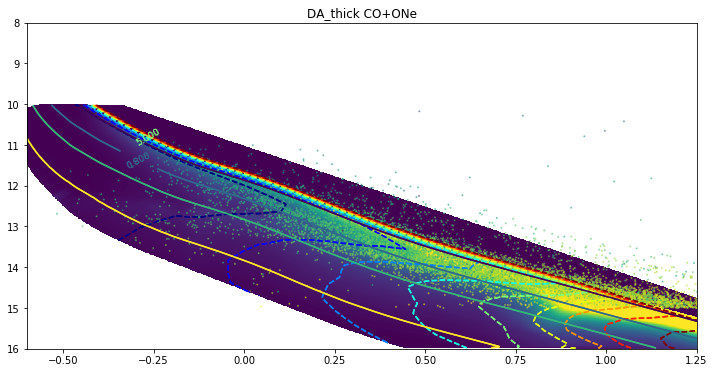

In [1151]:
plt.figure(figsize=(12,6))
x = WD['bp_rp']
y = WD['phot_g_mean_mag']+5*np.log10(WD['parallax']/1000)+5
z = WD['phot_bp_rp_excess_factor']
z = WD['phot_g_mean_mag']
selected = (y<15) * (y>8) * (x>-0.6) * (WD['phot_bp_rp_excess_factor']<1.40)*\
            (WD['parallax_over_error']>1) * (1/WD['parallax']<0.10)
    
WD_models.final_plot(0,0,90,stars='off')
plt.grid('off')

plt.scatter(x[selected],y[selected],c=z[selected],s=1,\
           alpha=0.5)
plt.xlim(-0.6,1.25)
plt.ylim(16,8)
plt.grid('off')
plt.show()

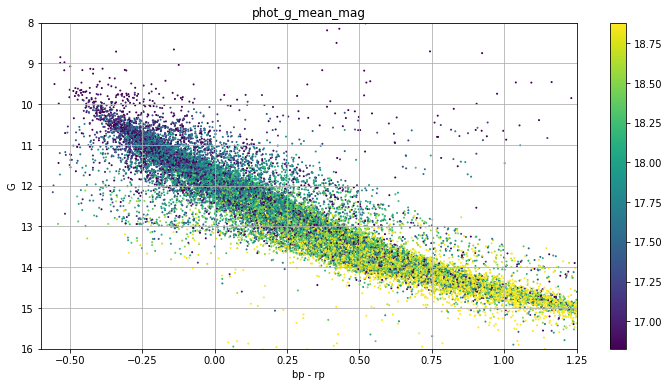

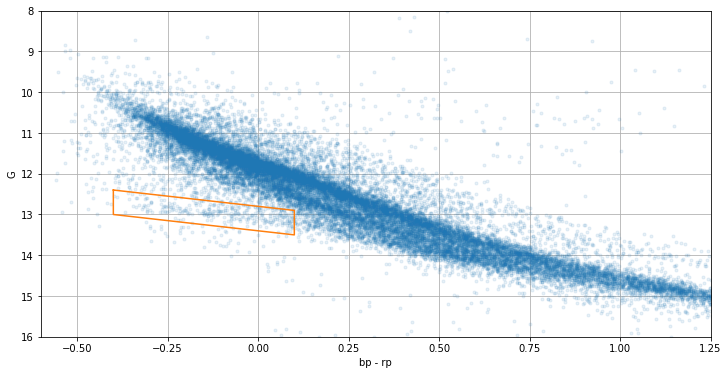

/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log10


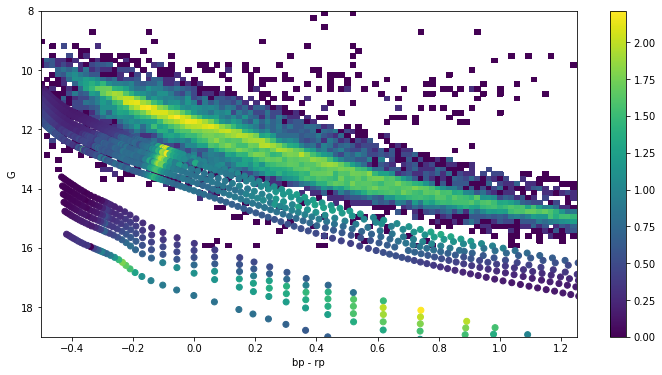

In [795]:
highsnr = (WD['parallax_over_error']>30) * (1/WD['parallax']<0.3)
plot_HR(WD[highsnr],plt_list,'phot_g_mean_mag',plt_box=False)#True)
plt.show()
selected_all_low = plot_HR(WD[highsnr],plt_list,True,plt_box=True,box=[-0.40,0.10,13.1,0.30,1])#True)
#plot_lowmass('DB','scatter')
#plot_lowmass('DB','scatter')
plt.show()
_ = plot_HR(WD[highsnr],plt_list,True,plt_box=False,plot_type='HR',hess=True)#True)
plot_lowmass('DB','scatter',4)
plot_highmass('DA','scatter',0)
plt.show()
xmin = 0.12; xmax = 0.40; offset = 0; width = 0.05; slope = 0
box = (xmin, xmax, offset, width, slope)


## crossmatch with GALEX

In [1731]:
WD_crossmatch_base = WD_sdss['ra','dec','source_id','phot_g_mean_mag','phot_bp_mean_mag',\
       'phot_rp_mean_mag','MWDD_index']
WD_crossmatch_base['sdss_objid2'] = Gaia_xmatch_sdss['obj_id']
temp = Table.read('WD_sdss.csv')
WD_crossmatch_base['sdss_objid'] = temp[Gaia_xmatch_sdss['index']]['obj_id']
WD_crossmatch_base.write('WD_xmatch_base.csv',overwrite=True)

In [ ]:
## analysing spectral lines

/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


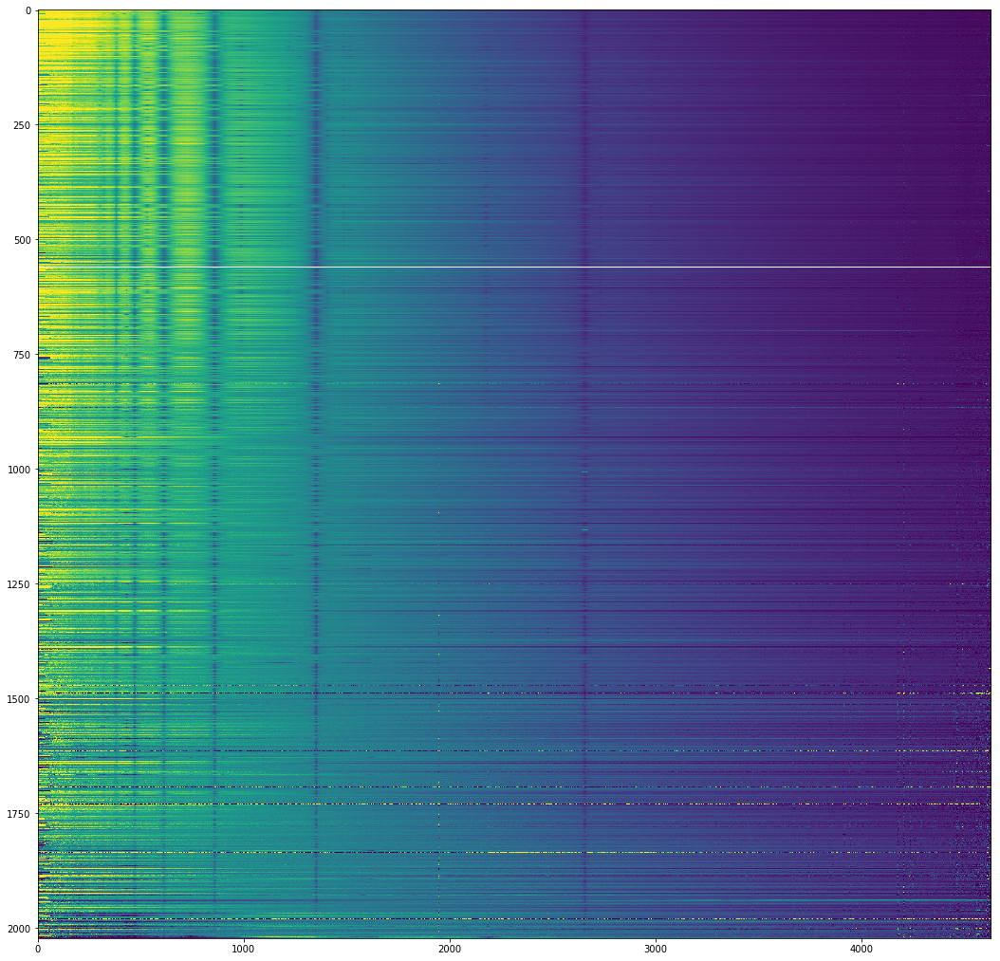

In [707]:
imshow_spec(WD_with_spec[high_snr_low],spec[high_snr_low,:],np.ones(high_snr_low.sum(),dtype=bool))

In [750]:
np.savetxt('spec.csv',spec[:,::5]/spec.mean(axis=1).reshape(-1,1))

/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


In [ ]:
select *
from MyDB.MWDD as M
  left join DR14.
    

## Write csv file

In [731]:
MWDD['MWDD_index']=np.arange(len(MWDD))
MWDD.write('WD_MWDD_my.csv',format='csv',overwrite=True)

In [746]:
WD_radec = WD['ra','dec']
WD_radec['WD_index'] = np.arange(len(WD_radec))
WD_radec.write('WD_radec.csv',format='csv',overwrite=True)

## MWDD spec

In [147]:
MWDD_spec_boss = Table.read('WD_MWDD_spec_boss.csv')
MWDD_spec_boss

objid,MWDD_index,MJD,PLATE,FIBERID,ra,dec
str19,int64,str5,str4,str4,str19,str14
1237661817102401543,0,56002,5438,380,204.74606,11.887981
1237673326002503787,1,null,null,null,null,null
1237665369571786847,2,56298,5795,460,144.84095,26.733636
1237658423550935283,3,null,null,null,null,null
1237661354317054013,4,null,null,null,null,null
1237661388138479777,5,null,null,null,null,null
1237662305654407180,6,null,null,null,null,null
1237659329779597679,7,null,null,null,null,null
1237672794496237635,8,57363,7898,452,0.711022539999988,-4.8449083


In [544]:
(MWDD_spec_boss['FIBERID']!='null').sum()

19797

### convert fits into npy for all spectra

In [ ]:
spec_boss = Table.read('WD_spec_boss.csv',format='csv')
spec_segue = Table.read('WD_spec_segue.csv',format='csv')
#spec_sdss = Table.read('WD_spec_sdss.csv',format='csv')
#spec_dr14 = Table.read('WD_spec_DR14.csv',format='csv')
spec_legacy = Table.read('WD_spec_legacy.csv',format='csv')
#table.remove_rows(np.where(table['index1'][1:]-table['index1'][:-1] == 0))
len(spec_boss), selected_sdss.sum()#len(WD_sdss)

In [ ]:
def gen_spec_npy(table, code, lam_standard):
    with_spec = table['MJD']!='null'
    print(with_spec.sum(), len(os.listdir(dir_WD_spectra+code+'/')))
    
    spec = np.empty((with_spec.sum(),len(lam_standard)))
    for i,with_spec_index in enumerate(np.where(with_spec)[0]):
        _, spec[i,:] = open_one_spec(table,code,lam_standard,with_spec_index,5,pl=False)
    #spec_norm = spec / spec.mean(axis=1).reshape(-1,1)
    spec[np.isnan(spec)] = 1
    np.save('WD_spec_'+code+'.npy',np.array([{'spec':spec,'lam_standard':lam_standard,\
                                            'with_spec':with_spec}]))
    return True

gen_spec_npy(spec_boss, 'boss', lam_standard_boss)
gen_spec_npy(spec_legacy, 'legacy', lam_standard_legacy)

table[np.where(with_spec)[0][2972]]


download the spec.npy to local computer and work at there. (finished)

scp scheng@dslogin01.pha.jhu.edu:/home/scheng/Gaia/WD_spec_legacy.npy .

## sequencer

In [764]:
spec.mean(axis=1)

array([ 21.56688864,   8.08397374,   4.23886753, ...,  54.86162187,
        22.68019317,   9.37333376])

/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


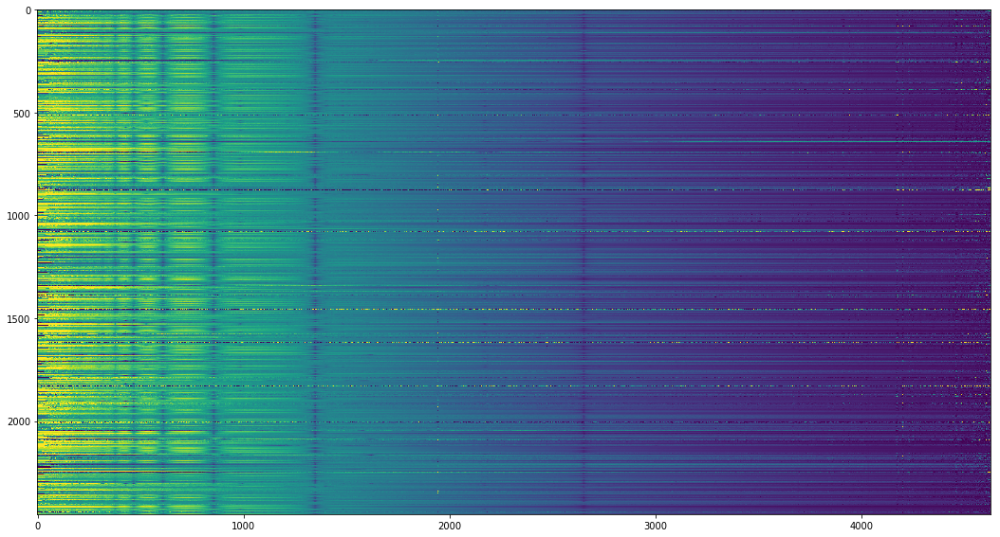

In [779]:
plt.figure(figsize=(18,18))
plt.imshow((spec/spec.mean(axis=1).reshape(-1,1))[spec.mean(axis=1)!=0],vmin=0,vmax=3)
plt.show()

In [803]:
np.savetxt('WD_sequencer_spec.csv',(spec/spec.mean(axis=1).reshape(-1,1))[spec.mean(axis=1)!=0][0:100,::5],delimiter=',')

/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


array([15, 40, 31,  8, 14, 66,  4, 96, 47, 36, 99, 18, 89, 69, 75, 27, 39,
       17, 94, 62, 50, 35, 53, 30, 76, 38, 37, 52, 33, 19, 72, 88,  0, 23,
       58, 81, 68, 70, 85, 28, 67, 77, 25, 90, 59,  7, 42,  1, 55, 63, 10,
       34, 93, 29, 83, 86, 11, 22, 54,  5, 12, 21, 57, 43, 46, 73, 24, 87,
       44,  6,  9, 78, 48, 97, 95,  2, 91, 71, 84, 65, 82, 13, 64, 51, 74,
       98, 16, 60, 92, 61, 79,  3, 41, 26, 56, 45, 20, 32, 80, 49])

/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


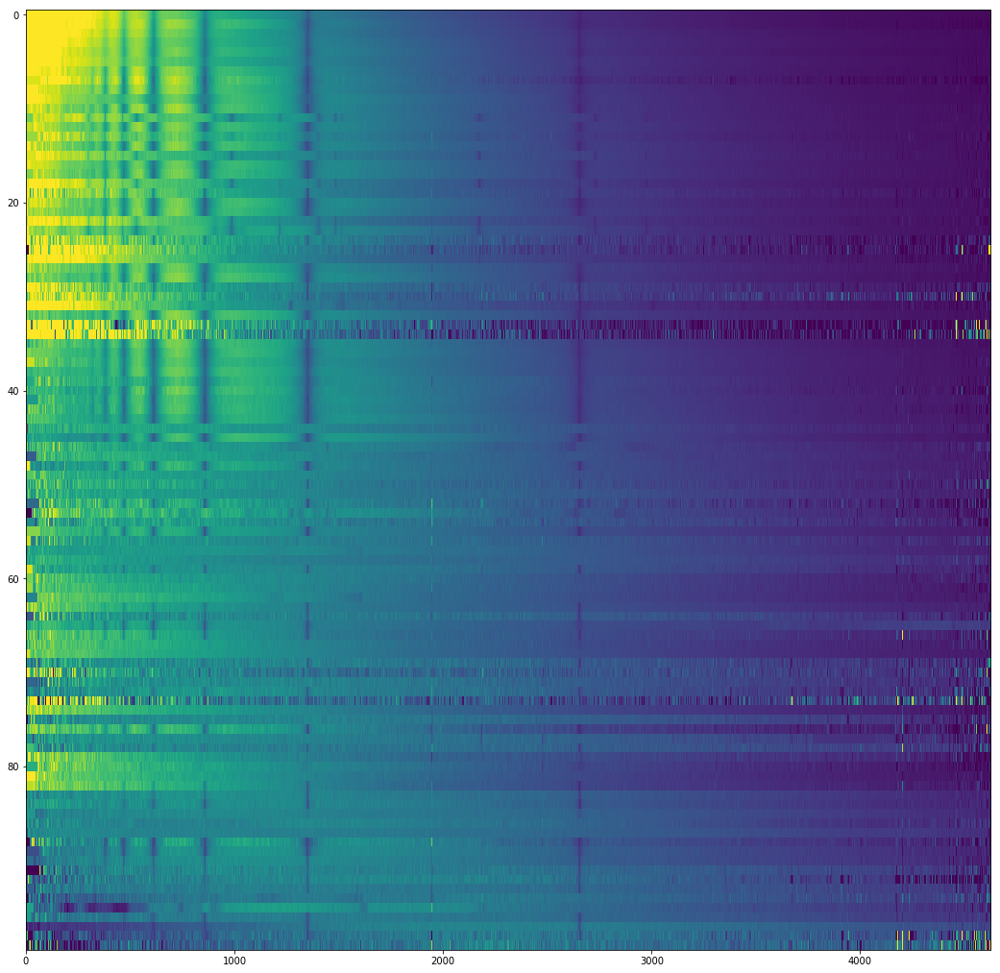

In [815]:
sequencer_index = np.loadtxt('results.txt.csv',delimiter=',',dtype=int)
plt.figure(figsize=(18,18))
plt.imshow((spec/spec.mean(axis=1).reshape(-1,1))[spec.mean(axis=1)!=0][sequencer_index,:],\
           vmin=0,vmax=3,aspect='auto')
plt.show()

In [776]:
spec.mean(axis=1)[990:1000]

array([ 10.55481606,   0.        ,  18.66031434,  19.38475679,
        38.84032768,  10.62958776,  15.3069021 ,  34.96757008,
         3.8183523 ,  32.15994254])

## WD_planet

In [842]:
(WD_planet['phot_g_mean_mag']-5*np.log10(1/WD_planet['parallax']*1000)+5>8).sum()

3916

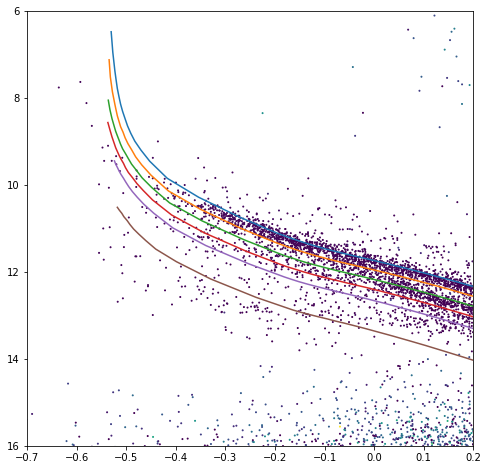

In [964]:
plt.figure(figsize=(8,8))
selected = (WD_planet['phot_bp_rp_excess_factor']<5) * (1/WD_planet['parallax']<0.1)
plt.scatter(WD_planet['bp_rp'][selected],\
         (WD_planet['phot_g_mean_mag']-5*np.log10(1/WD_planet['parallax']*1000)+5)[selected],\
           c = WD_planet['astrometric_excess_noise'][selected],\
           s=1)
plt.ylim(16,6)
plt.xlim(-0.7,0.2)
#plot_lowmass('DB')
plot_lowmass('DA')
plt.show()

# PCA

In [60]:
from sklearn.decomposition import PCA
def pca_analysis(vectors, x, n_component = 5,pl=[1,1,1,1,1]):
    pca = PCA(n_components = n_component,whiten=True,copy=True)
    pca.fit(vectors)
    if pl[0]==True:
        plt.plot(pca.explained_variance_ratio_,'.-')
        plt.show()
        print(pca.explained_variance_ratio_)
    if pl[1]==True:
        plt.plot(x, pca.inverse_transform(np.zeros(n_component)))  
        plt.show()
    if pl[2]==True:
        plt.figure(figsize=(12,24))
        for i in range(n_component):
            plt.subplot(10,2,i+1)
            vector = np.zeros(n_component)
            vector[i] = 1
            plt.plot(x, pca.inverse_transform(vector))  
        plt.show()
    components = pca.transform(vectors)
    if pl[3]==True:
        plt.figure(figsize=(18,18))
        for j in range(n_component):
            for i in range(n_component):
                plt.subplot(n_component,n_component,i+1+n_component*j)
                plt.plot(components[:,i],components[:,j],'.',alpha=0.05)
                #plt.plot(components[selected_a,i],components[selected_a,j],'.',alpha=0.05)
                #plt.plot(components[selected_b,i],components[selected_b,j],'.',alpha=0.05)
                plt.xlim(-4,4)
                plt.ylim(-4,4)
        plt.show()
    if pl[4]==True:
        plt.figure(figsize=(18,24))
        for i in range(80):
            plt.subplot(16,5,i+1)
            plt.plot(x,vectors[i,:])
            plt.plot(x,vectors[i,:] - pca.inverse_transform(components[i]))
        plt.show()
    return pca, components

2458 2458


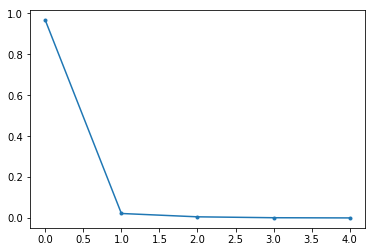

[  9.66696863e-01   2.23415634e-02   6.01907890e-03   1.61763740e-03
   6.84255106e-04]


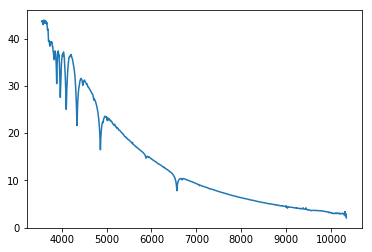

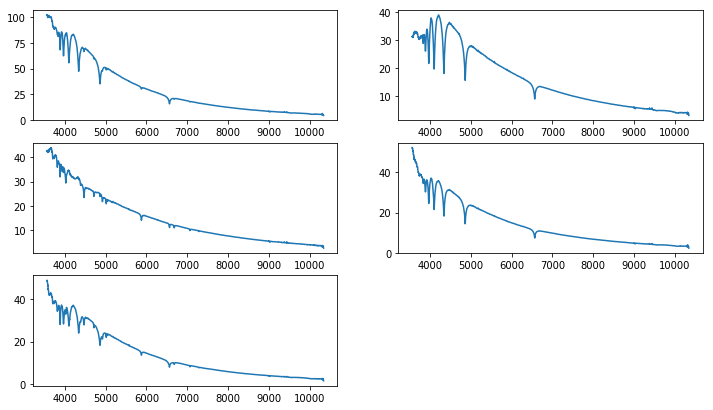

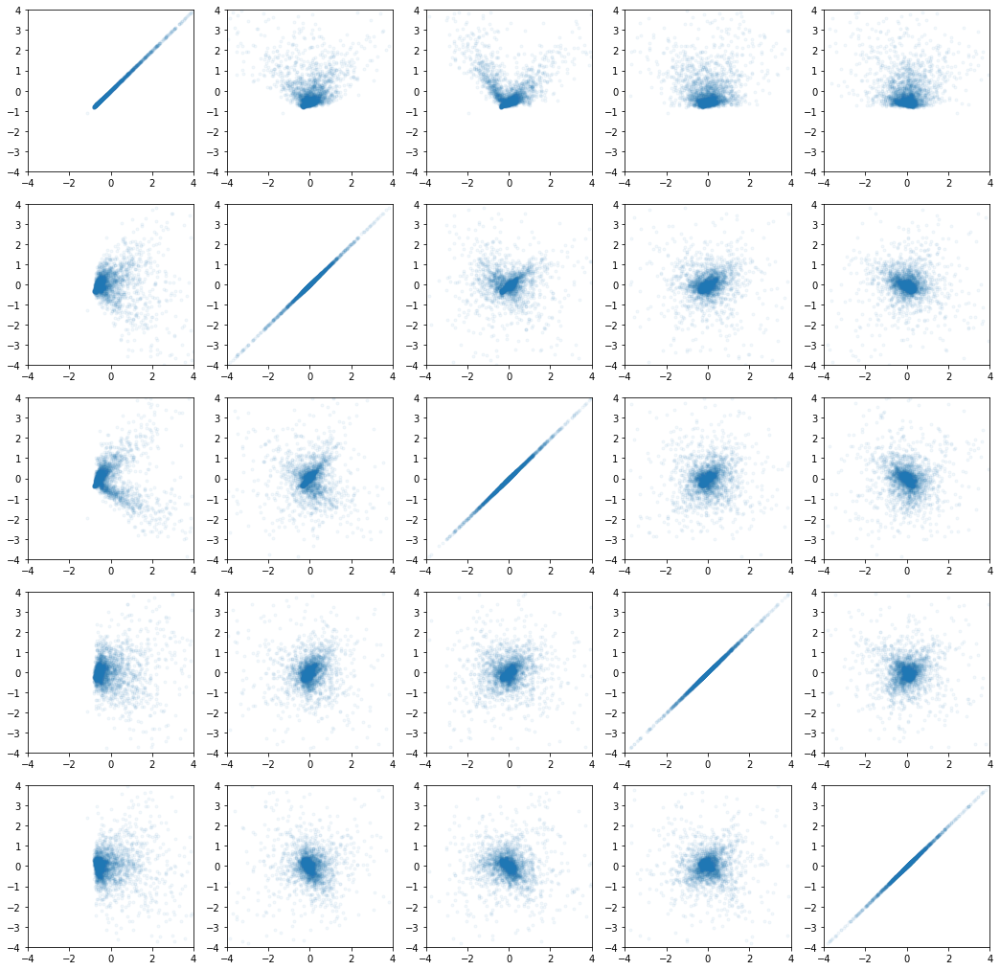

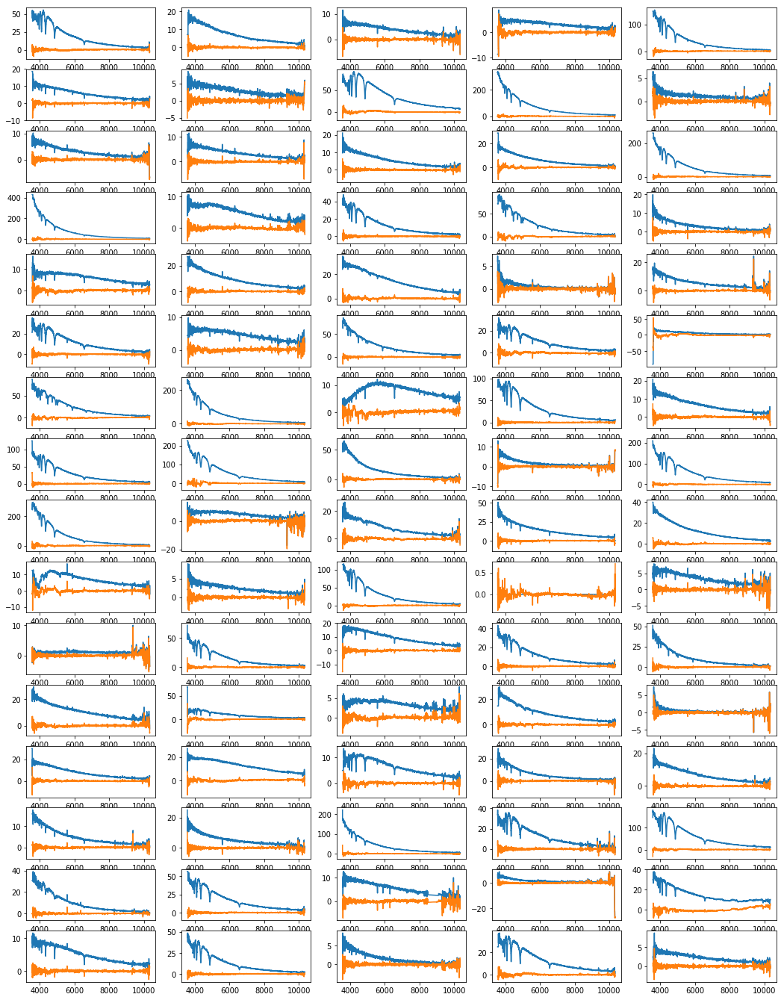

In [78]:
data = np.load('WD_spec_boss.npy')[0]
spec = data['spec']
lam_standard = data['lam_standard']
with_spec = data['with_spec']
print(len(spec), with_spec.sum())
pca_all,components = pca_analysis(spec, lam_standard, 5)

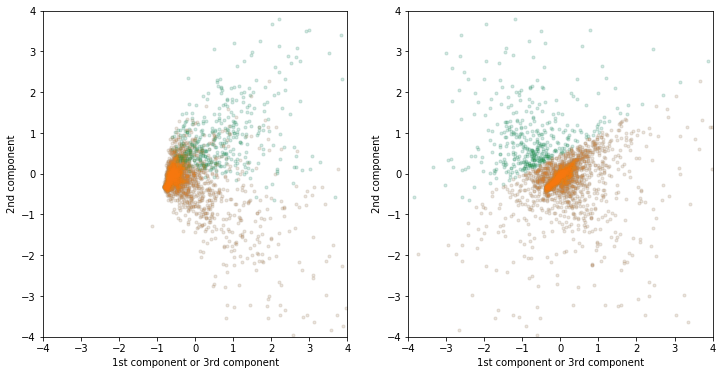

In [79]:
selected_b = (components[:,1] + components[:,0]*4/4 > 0.7) * \
            ~((components[:,2]<1.5)*(components[:,1] - components[:,2]*2/4 < 0.5)*(components[:,2]>-1))
selected_b = ~(components[:,1] - components[:,2]*2/4 < 0.5)

selected_a = (components[:,1] + components[:,0]*3/2 < -2)
selected_a =  ~selected_b

plt.figure(figsize=(12,6))
for i in range(2):
    plt.subplot(1,2,i+1)
    plt.plot(components[:,i*2],components[:,1],'.',alpha=0.1)
    plt.plot(components[:,i*2][selected_a],components[:,1][selected_a],'.',alpha=0.1)
    plt.plot(components[:,i*2][selected_b],components[:,1][selected_b],'.',alpha=0.1)
    plt.xlim(-4,4)
    plt.ylim(-4,4)
    plt.xlabel('1st component or 3rd component')
    plt.ylabel('2nd component')
plt.show()

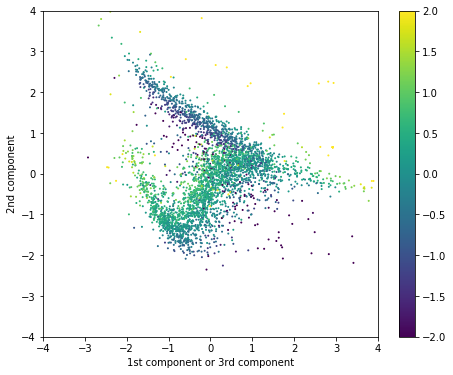

In [349]:
plt.figure(figsize=(7.5,6))
plt.scatter(components[:,0],components[:,1],c=components[:,2],s=1,vmin=-2,vmax=2)
plt.xlim(-4,4)
plt.ylim(-4,4)
plt.xlabel('1st component or 3rd component')
plt.ylabel('2nd component')
plt.colorbar()
plt.show()

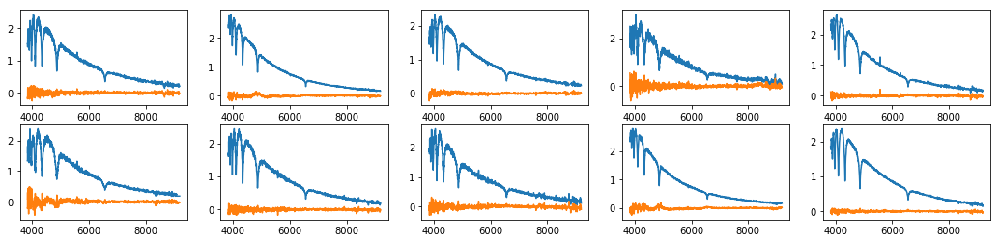

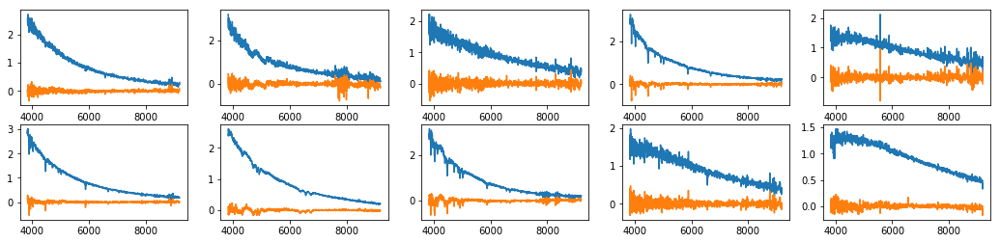

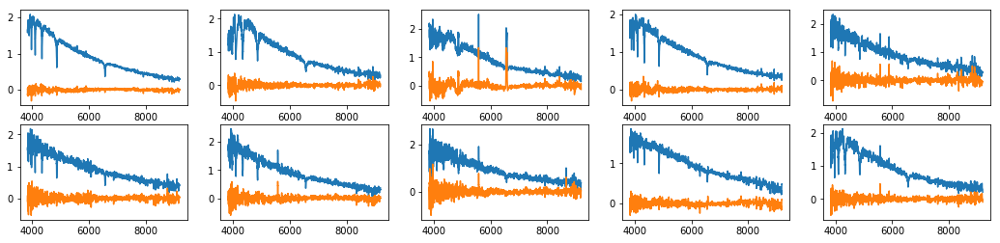

In [359]:
selected = selected_a
for selected in [selected_a,selected_b,selected_c]:
    plt.figure(figsize=(18,4))
    for i in range(10):
        plt.subplot(2,5,i+1)
        plt.plot(lam_standard,spec[selected][i,:])
        plt.plot(lam_standard,spec[selected][i,:] - pca.inverse_transform(components[selected][i]))
    plt.show()

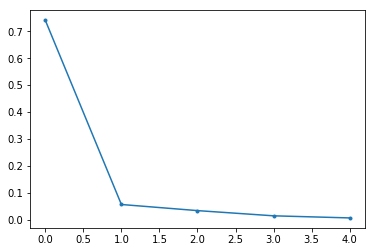

[ 0.74051337  0.05783607  0.03518464  0.01588338  0.00810285]


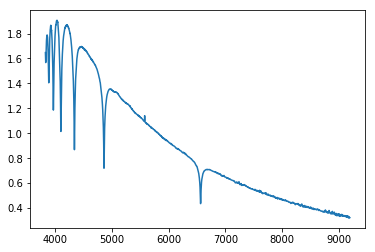

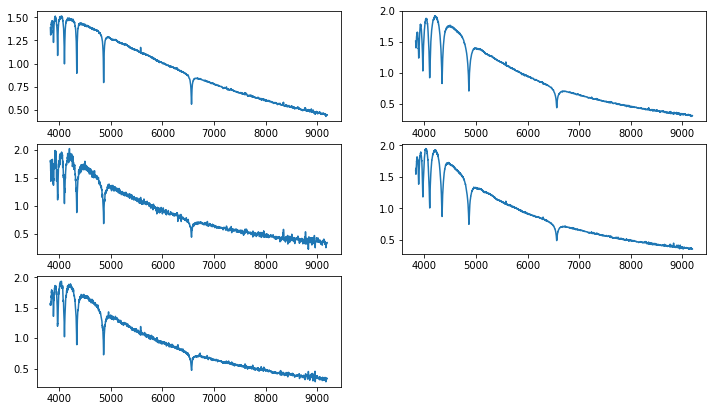

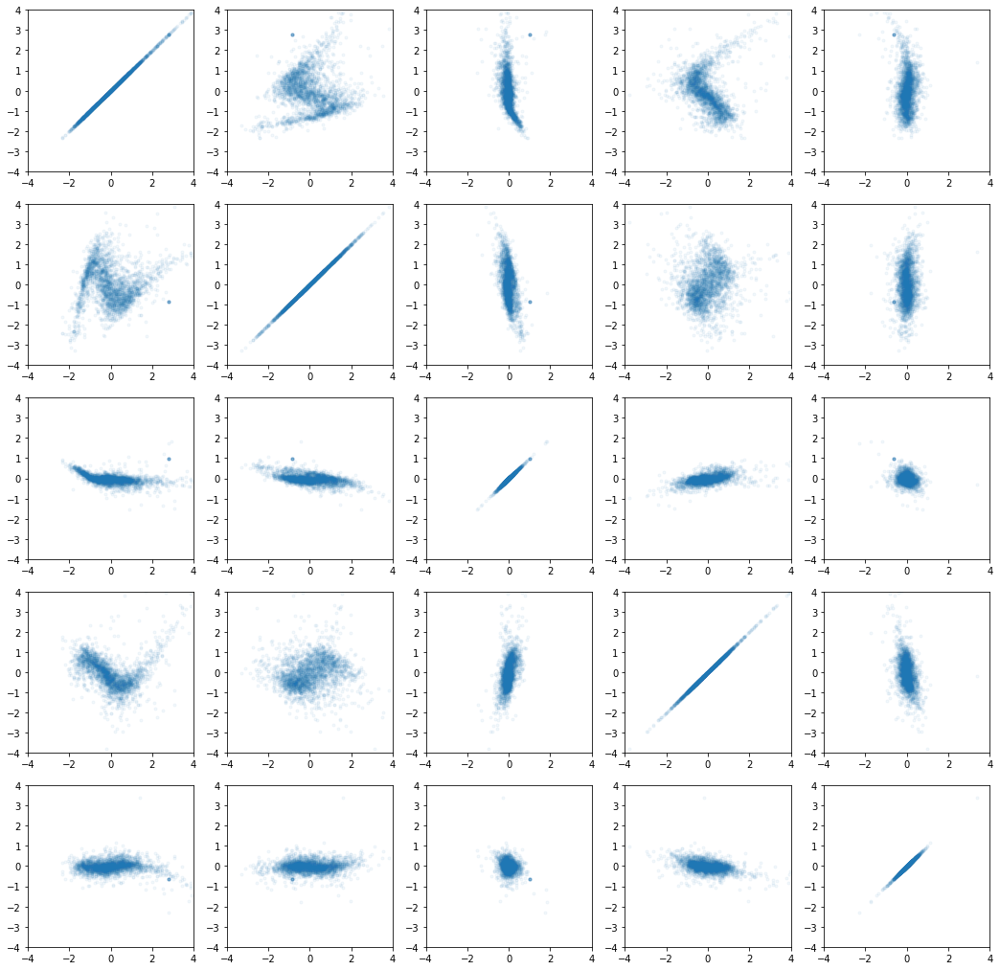

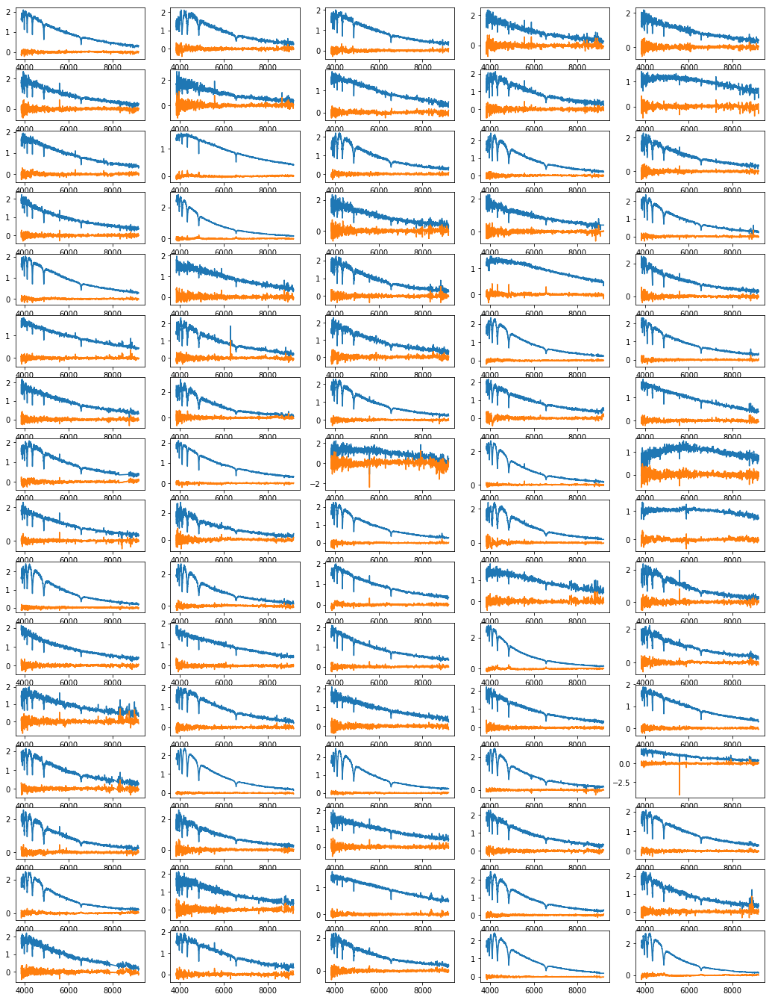

In [417]:
pca_A,_ = pca_analysis(spec[selected_a], lam_standard, 5)

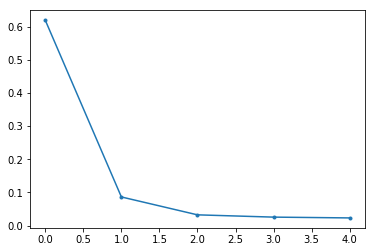

[ 0.61918675  0.08626875  0.03232331  0.02546297  0.02306365]


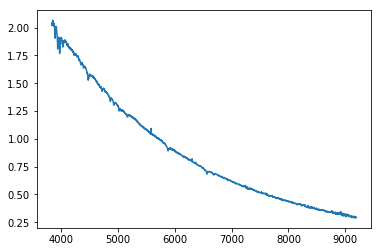

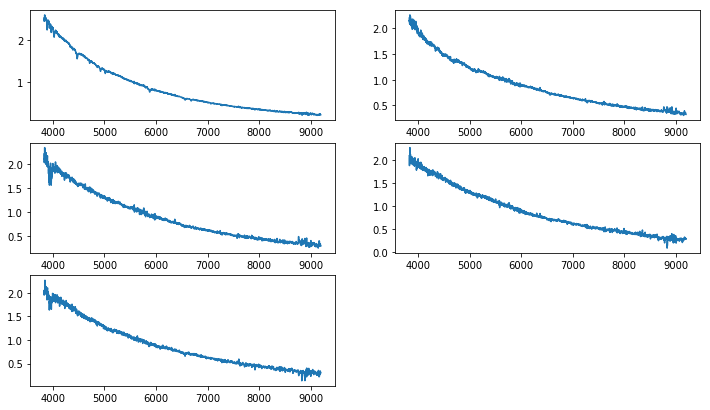

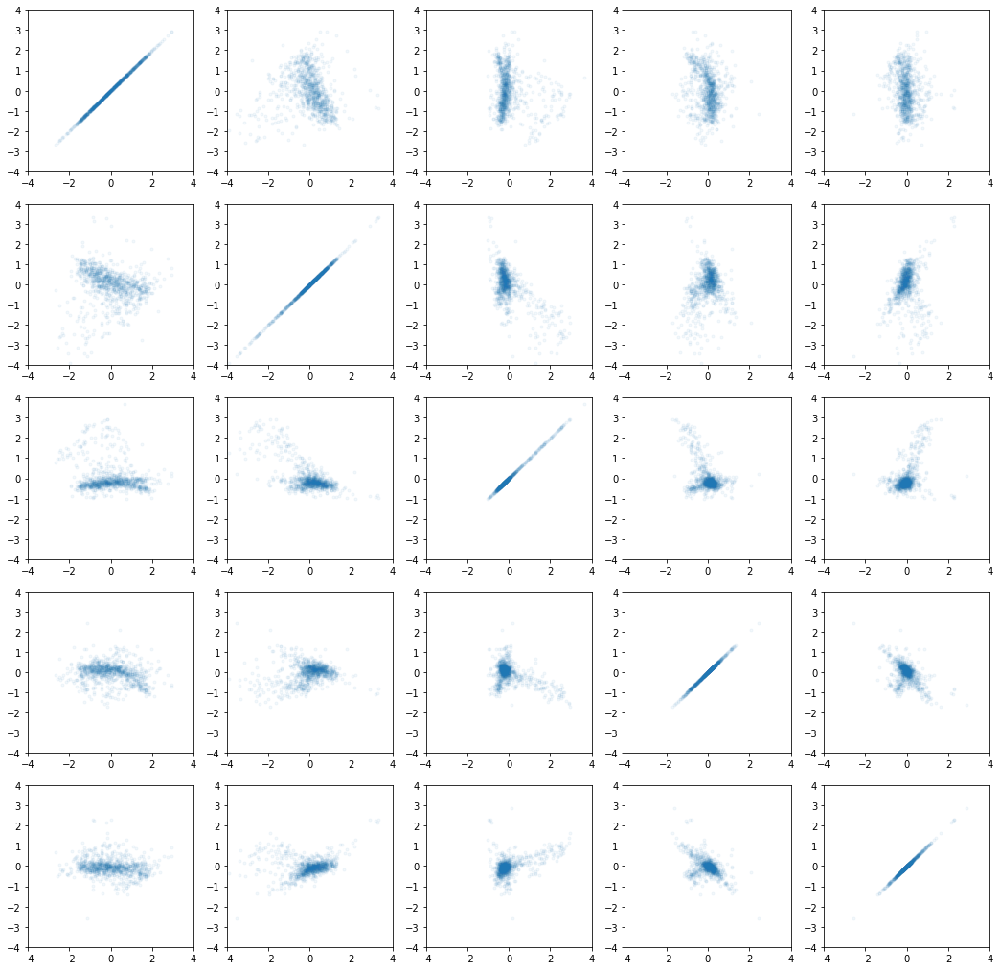

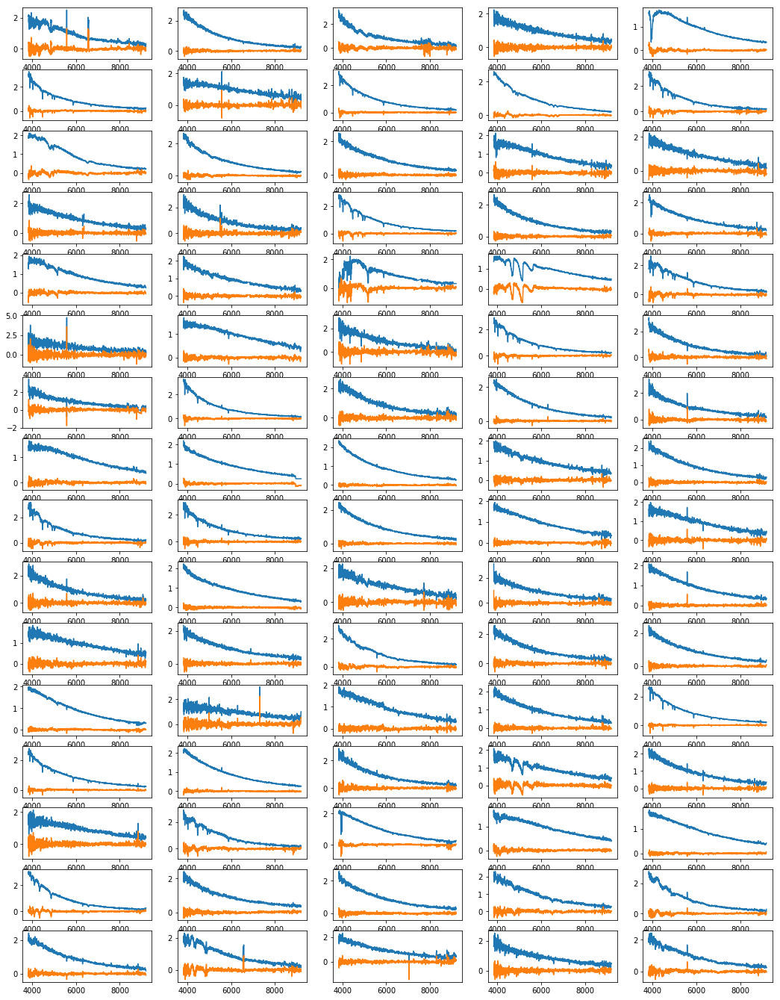

In [418]:
pca_B,_ = pca_analysis(spec[selected_b], lam_standard, 5)

In [549]:
spec[selected_b].shape

(946, 3803)

In [559]:
selected = pca_B.transform(spec[selected_b])[:,2]>0.5
selected = np.where(selected_b)[0][selected]
selected.size

108

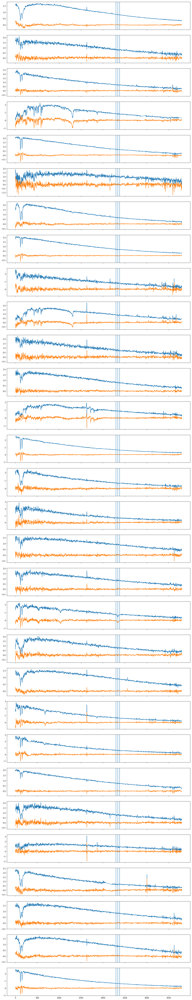

In [562]:
pca = pca_B
n = 30
components = pca.transform(spec[selected,:])
fig, axes = plt.subplots(n,1, sharex='col',figsize=(18,100))
for i in range(n):
    axes[i].plot(spec[selected[i],:])
    axes[i].plot(spec[selected[i],:] - pca.inverse_transform(components[i]))
    axes[i].axvline(2340)
    axes[i].axvline(2380)
    axes[i].axvline(2300)
plt.show()

(array([   3,  112,  160,  197,  243,  254,  353,  484,  572,  574,  600,
        645,  701,  720,  721,  859,  863,  961, 1159, 1335, 1450, 1638,
       2327, 2601, 2887, 2899, 2989]),)


/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.
/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less
  after removing the cwd from sys.path.
/Users/scheng/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in less
  """
/Users/scheng/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:748: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= mn)
/Users/scheng/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:749: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= mx)


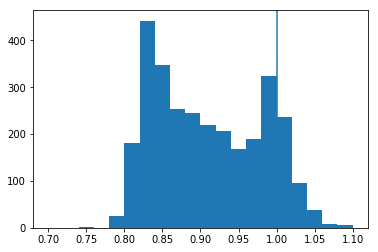

In [636]:
H_alpha = spec[index,2300:2380].sum(axis=1) /80 / (spec[index,2300]+spec[index,2380]) * 2 * 0.4 + \
                    spec[index,985:1085].sum(axis=1)/100 / (spec[index,985]+spec[index,1085]) * 2 * 0.6
#H_alpha = spec[:,2340] / (spec[:,2300]+spec[:,2380]) * 2 * 0.4 + spec[:,1035] / (spec[:,985]+spec[:,1085]) * 2 * 0.6

DB = np.abs(H_alpha-0.99)<0.02
DA = H_alpha<0.80
#print(np.where(DA))
print(np.where(DA))
plt.hist(H_alpha,20,(0.7,1.1))
plt.axvline(1)
plt.show()

In [627]:
H_alpha

array([ 84.89549742,  77.16727517,  91.40308147, ...,  84.0597393 ,
        75.26832672,  89.47278383])

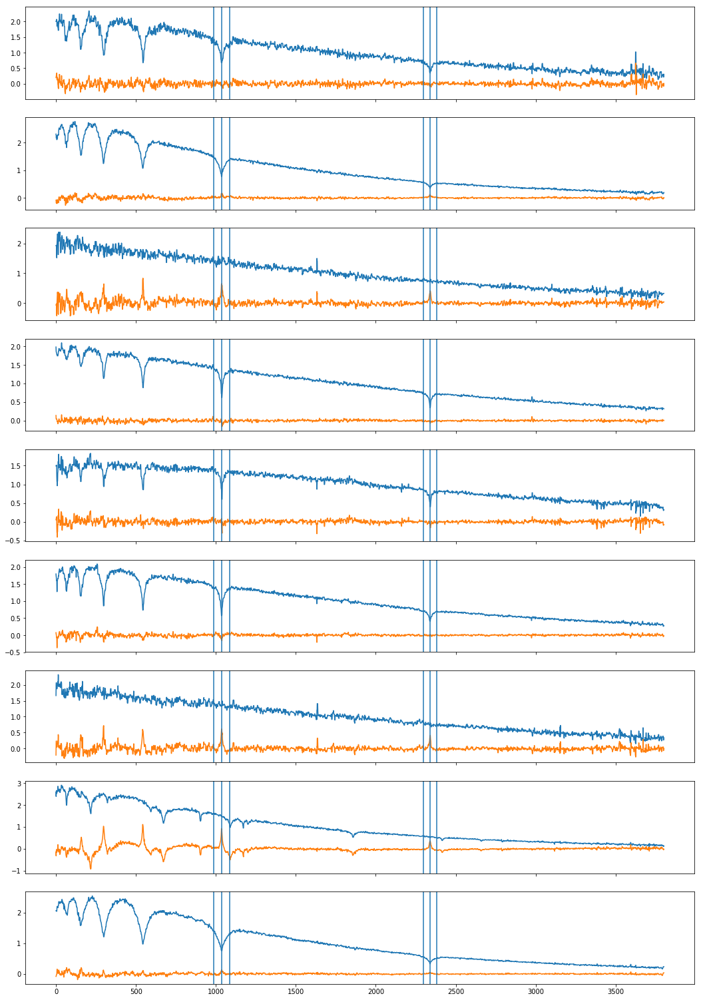

In [567]:
pca = pca_A
components = pca.transform(spec[index,:])
fig, axes = plt.subplots(9,1, sharex='col',figsize=(18,27))
for i in range(9):
    axes[i].plot(spec[index[i],:])
    axes[i].plot(spec[index[i],:] - pca.inverse_transform(components[i]))
    axes[i].axvline(2340)
    axes[i].axvline(2380)
    axes[i].axvline(2300)
    
    axes[i].axvline(1035)
    axes[i].axvline(985)
    axes[i].axvline(1085)
plt.show()

In [585]:
DB

array([False, False,  True, ...,  True,  True, False], dtype=bool)

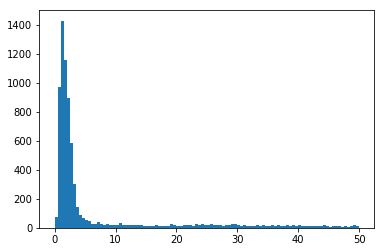

11788.235709 241


In [27]:
selected = (data['koi_steff']<3900)
factor = ((data['koi_period']/365)**(2/3)/data['koi_sma']**(1/3)*231/data['koi_srad'])
(factor[selected]).sum()
plt.hist(data['koi_prad'],range=(0,50),bins=100)
plt.show()
print((factor[selected*(factor<150)*(data['koi_prad']<4)]).sum(),selected.sum())

In [28]:
data = Table.read('cumulative.csv')
len(data)

7931